In [1]:
import os
import pandas as pd
import numpy as np
import sklearn
import scanpy as sc
import anndata
import shap
import subprocess
import umap
import seaborn as sns
from collections import Counter
import matplotlib.pyplot as plt

import mgitools.os_helpers as os_helpers

In [2]:
%load_ext autoreload 

In [3]:
%autoreload 2

In [4]:
from pollock.models.model import (embed_from_anndata, predict_from_anndata,
                                  load_from_directory, balancedish_training_generator,
                                 PollockDataset, PollockModel)
from pollock.models.explain import explain_predictions

## HCA immune/stem analysis

In [5]:
module_fp = '/home/estorrs/rds_conversion/data/scRNAseq/immune/immune_module'

In [6]:
adata = sc.read_h5ad('/home/estorrs/rds_conversion/data/scRNAseq/immune/annotated_raw_counts.h5ad')
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 69421 × 58347
    obs: 'cell_id', 'analysis_protocol.protocol_core.protocol_id_x', 'analysis_protocol.provenance.document_id_x', 'analysis_working_group_approval_status_x', 'barcode_x', 'bundle_uuid_x', 'bundle_version_x', 'cell_suspension.genus_species.ontology_x', 'cell_suspension.genus_species.ontology_label_x', 'cell_suspension.provenance.document_id_x', 'derived_organ_label_x', 'derived_organ_ontology_x', 'derived_organ_parts_label_x', 'derived_organ_parts_ontology_x', 'donor_organism.development_stage.ontology_x', 'donor_organism.development_stage.ontology_label_x', 'donor_organism.diseases.ontology_x', 'donor_organism.diseases.ontology_label_x', 'donor_organism.human_specific.ethnicity.ontology_x', 'donor_organism.human_specific.ethnicity.ontology_label_x', 'donor_organism.is_living_x', 'donor_organism.provenance.document_id_x', 'donor_organism.sex_x', 'dss_bundle_fqid_x', 'emptydrops_is_cell_x', 'file_uuid_x', 'file_version_x', 'genes_detect

In [7]:
adata.var_names_make_unique()

Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD113-1', 'SNORD113-2', 'SNORD113-3', 'SNORD113-4', 'SNORD113-5']


In [8]:
adata.obs['cell_type'] = adata.obs['Cluster Name'].to_list()

In [9]:
Counter(adata.obs['cell_type']).most_common()

[('Naive T-cell', 24365),
 ('Neutrophil', 6662),
 ('Follicular B cell', 5183),
 ('Immature-Neutrophil', 4930),
 ('CD8 T-cell', 4609),
 ('NK cells', 4490),
 ('Dendritic Cell', 3584),
 ('Monocyte', 2647),
 ('Erythroblast', 1857),
 ('Plasma Cell', 1733),
 ('CD34+ HSC', 1660),
 ('Pro-B', 1320),
 ('Eosinophil', 1163),
 ('CD34+ pre-PC', 809),
 ('CD34+ pre-B', 727),
 ('CD34+ Gran', 457),
 ('CD34+ pre-B cycling', 451),
 ('Granulocytic-UNK', 430),
 ('Early-Erythroblast', 320),
 ('CD34+ MultiLin', 250),
 ('CD34+ LMPP', 227),
 ('CD34+ CLP', 219),
 ('Pre-Dendritic', 211),
 ('CD34+ ERP-Early', 200),
 ('Stromal', 157),
 ('CD34+ HSC-cycle', 137),
 ('CD34+ MKP', 117),
 ('CD34+ MEP', 111),
 ('CD34+ MDP-1', 87),
 ('CD34+ ERP', 84),
 ('CD34+ Eo/B/Mast', 76),
 ('CD34+ MDP-2', 50),
 ('CD34+ Lymphoid UNK', 42),
 ('Platelet', 41),
 ('CD34+ pre-T', 15)]

In [10]:
train = adata.copy()

In [11]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=3000)
adata.raw = adata

adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata)

sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)


is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type' as categorical
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


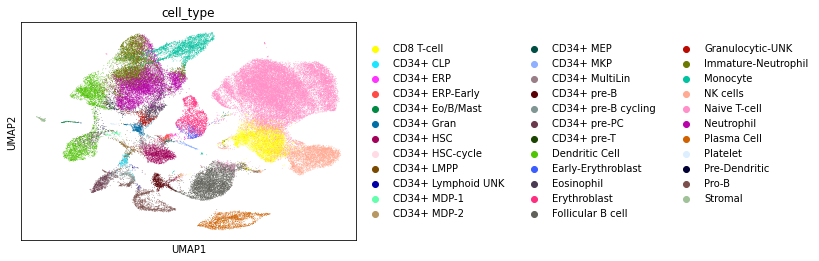

In [12]:
sc.pl.umap(adata, color=['cell_type'], ncols=2)

In [13]:
# counts = train.copy()
# counts

In [14]:
# train, rest = balancedish_training_generator(counts, 'cell_type', n_per_cell_type=2000, split=1.)
# train

In [15]:
## train module
pds = PollockDataset(train.copy(), cell_type_key='cell_type', n_per_cell_type=200,
                    oversample=True, dataset_type='training', )

2020-12-03 10:18:08,497 input dataset shape: (69421, 58347)
2020-12-03 10:18:08,508 possible cell types: ['CD34+ CLP', 'CD34+ ERP', 'CD34+ ERP-Early', 'CD34+ Eo/B/Mast', 'CD34+ Gran', 'CD34+ HSC', 'CD34+ HSC-cycle', 'CD34+ LMPP', 'CD34+ Lymphoid UNK', 'CD34+ MDP-1', 'CD34+ MDP-2', 'CD34+ MEP', 'CD34+ MKP', 'CD34+ MultiLin', 'CD34+ pre-B', 'CD34+ pre-B cycling', 'CD34+ pre-PC', 'CD34+ pre-T', 'CD8 T-cell', 'Dendritic Cell', 'Early-Erythroblast', 'Eosinophil', 'Erythroblast', 'Follicular B cell', 'Granulocytic-UNK', 'Immature-Neutrophil', 'Monocyte', 'NK cells', 'Naive T-cell', 'Neutrophil', 'Plasma Cell', 'Platelet', 'Pre-Dendritic', 'Pro-B', 'Stromal']
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [16]:
pm = PollockModel(pds.cell_types, pds.train_adata.shape[1], alpha=.005, latent_dim=25, )

In [17]:
pm.fit(pds, epochs=20)

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


2020-12-03 10:19:31,469 5 out of the last 17 calls to <function compute_loss at 0x7fd7135ebb00> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings is likely due to passing python objects instead of tensors. Also, tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. Please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for more details.


2020-12-03 10:19:31,727 6 out of the last 18 calls to <function compute_loss at 0x7fd7135ebb00> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings is likely due to passing python objects instead of tensors. Also, tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. Please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for more details.


2020-12-03 10:19:31,954 7 out of the last 19 calls to <function compute_loss at 0x7fd7135ebb00> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings is likely due to passing python objects instead of tensors. Also, tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. Please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for more details.


2020-12-03 10:19:32,353 7 out of the last 11 calls to <function compute_loss at 0x7fd7135ebb00> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings is likely due to passing python objects instead of tensors. Also, tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. Please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for more details.


2020-12-03 10:19:32,728 8 out of the last 13 calls to <function compute_loss at 0x7fd7135ebb00> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings is likely due to passing python objects instead of tensors. Also, tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. Please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for more details.
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:19:46,030 epoch: 1, train loss: 40.523109436035156, val loss: 38.071781158447266
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:20:36,974 epoch: 2, train l

In [18]:
pm.save(pds, module_fp)

metadata on a dtype may be saved or ignored, but will raise if saved when read. Use another form of storage.


Text(87.0, 0.5, 'Groundtruth')

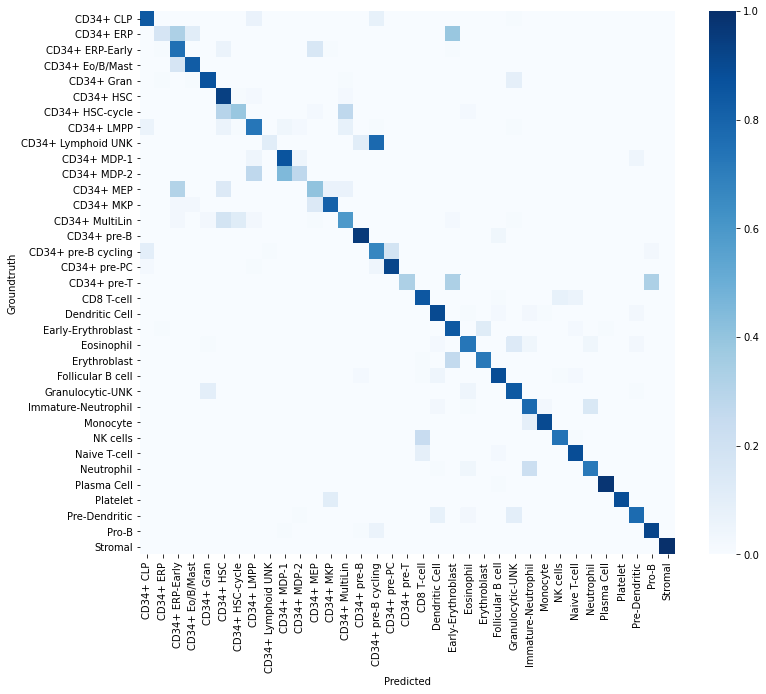

In [19]:
plt.subplots(figsize=(12, 10))
confusion_matrix = pd.DataFrame(data=pm.summary['validation']['confusion_matrix'], columns=pm.class_names,
                  index=pm.class_names)
sns.heatmap(confusion_matrix, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Groundtruth')

In [20]:
predictions = predict_from_anndata(train.copy(), module_fp)
predictions

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:36:24,666 0 genes in training set are missing from prediction set
2020-12-03 10:36:26,154 starting batch 1 of 7
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:36:26,442 0 genes in training set are missing from prediction set
2020-12-03 10:37:15,976 starting batch 2 of 7
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:37:16,324 0 genes in training set are missing from prediction set
2020-12-03 10:38:17,849 starting batch 3 of 7
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:38:18,497 0 genes in training set are missing from prediction set
2020-12-03 10:39:20,097 starting batch 4 of 7
is_categorical is deprecated and will be removed in a future version.  Use is_ca

,predicted_cell_type,cell_type_probability,probability_CD34+ CLP,probability_CD34+ ERP,probability_CD34+ ERP-Early,probability_CD34+ Eo/B/Mast,probability_CD34+ Gran,probability_CD34+ HSC,probability_CD34+ HSC-cycle,probability_CD34+ LMPP,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
cell_id,,,,,,,,,,,,,,,,,,,,,
MantonBM7_HiSeq_6-GCATGCGCATCTGGTA-1.BM7,Naive T-cell,0.86,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.0,0.01,0.86,0.00,0.0,0.00,0.0,0.00,0.0
MantonBM3_HiSeq_3-AGAATAGGTCGACTAT-1.BM3,Naive T-cell,0.96,0.00,0.0,0.00,0.01,0.00,0.00,0.00,0.00,...,0.00,0.0,0.00,0.96,0.01,0.0,0.00,0.0,0.00,0.0
MantonBM1_HiSeq_1-AGGGTGAGTTATTCTC-1.BM1,Follicular B cell,0.46,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.0,0.02,0.45,0.01,0.0,0.00,0.0,0.00,0.0
MantonBM3_HiSeq_3-TTTGCGCGTACCGCTG-1.BM3,Naive T-cell,0.89,0.00,0.0,0.01,0.00,0.01,0.00,0.00,0.00,...,0.01,0.0,0.01,0.89,0.01,0.0,0.00,0.0,0.00,0.0
MantonBM3_HiSeq_3-TACTCGCGTTGACGTT-1.BM3,Eosinophil,0.66,0.01,0.0,0.00,0.01,0.00,0.00,0.00,0.00,...,0.10,0.0,0.00,0.00,0.16,0.0,0.01,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MantonBM4_HiSeq_2-CCTCTGAAGATGCCTT-1.BM4,CD34+ HSC,0.35,0.03,0.0,0.01,0.01,0.01,0.35,0.09,0.13,...,0.00,0.0,0.01,0.01,0.00,0.0,0.00,0.0,0.00,0.0
MantonBM2_HiSeq_2-TTGTAGGAGGTCGGAT-1.BM2,Erythroblast,0.94,0.00,0.0,0.01,0.00,0.00,0.00,0.00,0.00,...,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.02,0.0
MantonBM6_HiSeq_1-CCTACCACAGCCTTTC-1.BM6,CD34+ LMPP,0.87,0.00,0.0,0.01,0.00,0.00,0.04,0.01,0.87,...,0.00,0.0,0.01,0.00,0.00,0.0,0.00,0.0,0.00,0.0


In [21]:
adata.obs = pd.merge(adata.obs, predictions, right_index=True, left_index=True)
adata.obs

,cell_id,analysis_protocol.protocol_core.protocol_id_x,analysis_protocol.provenance.document_id_x,analysis_working_group_approval_status_x,barcode_x,bundle_uuid_x,bundle_version_x,cell_suspension.genus_species.ontology_x,cell_suspension.genus_species.ontology_label_x,cell_suspension.provenance.document_id_x,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
MantonBM7_HiSeq_6-GCATGCGCATCTGGTA-1.BM7,MantonBM7_HiSeq_6-GCATGCGCATCTGGTA-1.BM7,optimus_v1.3.2,e42ca7a2-19a1-472c-9a0e-be5d0c20bf94,blessed,GCATGCGCATCTGGTA,095feee2-715c-4c7a-8e0a-4b21e1a14b8f,2019-07-31T041932.220696Z,NCBITaxon:9606,Homo sapiens,9eee36c4-e989-43ff-8aef-8e126b19f7ad,...,0.00,0.0,0.01,0.86,0.00,0.0,0.00,0.0,0.00,0.0
MantonBM3_HiSeq_3-AGAATAGGTCGACTAT-1.BM3,MantonBM3_HiSeq_3-AGAATAGGTCGACTAT-1.BM3,optimus_v1.3.2,825c392f-23cd-4ceb-aae2-41922c07712b,blessed,AGAATAGGTCGACTAT,bf43466a-31d7-4f12-a6c1-f25d1f3ad44b,2019-07-31T042535.399397Z,NCBITaxon:9606,Homo sapiens,12686588-47c0-4da2-b380-e91e06794687,...,0.00,0.0,0.00,0.96,0.01,0.0,0.00,0.0,0.00,0.0
MantonBM1_HiSeq_1-AGGGTGAGTTATTCTC-1.BM1,MantonBM1_HiSeq_1-AGGGTGAGTTATTCTC-1.BM1,optimus_v1.3.2,84e3fd9a-91ea-4249-a843-99365acd689c,blessed,AGGGTGAGTTATTCTC,a682189e-3a08-4098-8392-f576c765d27a,2019-07-31T041038.854013Z,NCBITaxon:9606,Homo sapiens,4ecf40b0-90be-4b21-958b-d03cd8991299,...,0.00,0.0,0.02,0.45,0.01,0.0,0.00,0.0,0.00,0.0
MantonBM3_HiSeq_3-TTTGCGCGTACCGCTG-1.BM3,MantonBM3_HiSeq_3-TTTGCGCGTACCGCTG-1.BM3,optimus_v1.3.2,825c392f-23cd-4ceb-aae2-41922c07712b,blessed,TTTGCGCGTACCGCTG,bf43466a-31d7-4f12-a6c1-f25d1f3ad44b,2019-07-31T042535.399397Z,NCBITaxon:9606,Homo sapiens,12686588-47c0-4da2-b380-e91e06794687,...,0.01,0.0,0.01,0.89,0.01,0.0,0.00,0.0,0.00,0.0
MantonBM3_HiSeq_3-TACTCGCGTTGACGTT-1.BM3,MantonBM3_HiSeq_3-TACTCGCGTTGACGTT-1.BM3,optimus_v1.3.2,825c392f-23cd-4ceb-aae2-41922c07712b,blessed,TACTCGCGTTGACGTT,bf43466a-31d7-4f12-a6c1-f25d1f3ad44b,2019-07-31T042535.399397Z,NCBITaxon:9606,Homo sapiens,12686588-47c0-4da2-b380-e91e06794687,...,0.10,0.0,0.00,0.00,0.16,0.0,0.01,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MantonBM4_HiSeq_2-CCTCTGAAGATGCCTT-1.BM4,MantonBM4_HiSeq_2-CCTCTGAAGATGCCTT-1.BM4,optimus_v1.3.2,fc0f383a-1cf0-48c2-bbeb-2dc8bf648bdb,blessed,CCTCTGAAGATGCCTT,ceea3341-9b96-4b94-ac5d-a70a1dea2095,2019-07-31T041602.199430Z,NCBITaxon:9606,Homo sapiens,4eaa922f-e907-47ed-8621-a13b83fac411,...,0.00,0.0,0.01,0.01,0.00,0.0,0.00,0.0,0.00,0.0
MantonBM2_HiSeq_2-TTGTAGGAGGTCGGAT-1.BM2,MantonBM2_HiSeq_2-TTGTAGGAGGTCGGAT-1.BM2,optimus_v1.3.2,a9929cae-f352-4e1e-8aad-8442bd3609cb,blessed,TTGTAGGAGGTCGGAT,b155bcc6-5cbd-4434-9320-f6ec5ee0eb80,2019-07-31T045543.652269Z,NCBITaxon:9606,Homo sapiens,e4803873-4df7-4af9-accf-053667f133cc,...,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.02,0.0
MantonBM6_HiSeq_1-CCTACCACAGCCTTTC-1.BM6,MantonBM6_HiSeq_1-CCTACCACAGCCTTTC-1.BM6,optimus_v1.3.2,e59613f3-b190-4812-9424-61060ca14b34,blessed,CCTACCACAGCCTTTC,6653c144-8b69-4674-9e43-a1701f9f5fc9,2019-07-31T052245.037055Z,NCBITaxon:9606,Homo sapiens,da5aaa51-92aa-4f85-943e-31dc1bdd1a72,...,0.00,0.0,0.01,0.00,0.00,0.0,0.00,0.0,0.00,0.0
MantonBM6_HiSeq_2-TGGTTAGTCAGCGACC-1.BM6,MantonBM6_HiSeq_2-TGGTTAGTCAGCGACC-1.BM6,optimus_v1.3.2,cc32c475-bf11-4e70-b3e2-b328758e13f2,blessed,TGGTTAGTCAGCGACC,e8245859-e04d-45ed-b7fa-49f877461c82,2019-07-31T052310.876097Z,NCBITaxon:9606,Homo sapiens,4e95a370-8218-479a-b6dd-a82ba6ed6fff,...,0.01,0.0,0.01,0.89,0.00,0.0,0.00,0.0,0.00,0.0


In [22]:
embeddings = embed_from_anndata(train.copy(), module_fp)
embeddings

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:43:05,854 0 genes in training set are missing from prediction set
2020-12-03 10:43:07,666 starting batch 1 of 7
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 10:43:08,321 0 genes in training set are missing from prediction set
2020-12-03 10:44:10,726 starting batch 2 of 7
2020-12-03 10:44:11,467 0 genes in training set are missing from prediction set
2020-12-03 10:45:14,838 starting batch 3 of 7
2020-12-03 10:45:15,355 0 genes in training set are missing from prediction set
2020-12-03 10:46:18,665 starting batch 4 of 7
2020-12-03 10:46:19,206 0 genes in training set are missing from prediction set
2020-12-03 10:47:17,060 starting batch 5 of 7
2020-12-03 10:47:17,473 0 genes in training set are missing from prediction set
2020-12-03 10:48:04,311 starting batch 6 of 7
2020-12-03 10:48:04,817 0 genes in t

,CELL_EMBEDDING_1,CELL_EMBEDDING_2,CELL_EMBEDDING_3,CELL_EMBEDDING_4,CELL_EMBEDDING_5,CELL_EMBEDDING_6,CELL_EMBEDDING_7,CELL_EMBEDDING_8,CELL_EMBEDDING_9,CELL_EMBEDDING_10,...,CELL_EMBEDDING_16,CELL_EMBEDDING_17,CELL_EMBEDDING_18,CELL_EMBEDDING_19,CELL_EMBEDDING_20,CELL_EMBEDDING_21,CELL_EMBEDDING_22,CELL_EMBEDDING_23,CELL_EMBEDDING_24,CELL_EMBEDDING_25
MantonBM7_HiSeq_6-GCATGCGCATCTGGTA-1.BM7,0.013331,0.625911,0.015150,-0.108592,0.489398,0.403621,0.542496,0.361336,-0.221796,-0.124597,...,0.724904,-0.115392,-0.548119,0.814434,-1.301938,0.324996,-0.814635,-0.153431,-0.217103,0.641531
MantonBM3_HiSeq_3-AGAATAGGTCGACTAT-1.BM3,1.022910,0.398530,0.112508,-0.094040,0.517415,0.970213,-0.094678,0.907650,-0.105024,-0.325444,...,1.246924,-0.640802,-0.657982,0.878385,-2.095634,0.440842,-0.748434,0.071148,0.584723,0.636449
MantonBM1_HiSeq_1-AGGGTGAGTTATTCTC-1.BM1,0.585703,0.535306,-0.388174,0.153601,1.110141,0.754452,0.581661,0.219659,-0.199064,-1.024612,...,0.801925,-1.158150,-0.431237,1.069845,-2.075628,0.422194,-0.778336,-0.515572,-0.093561,0.404410
MantonBM3_HiSeq_3-TTTGCGCGTACCGCTG-1.BM3,1.307431,0.641849,-0.233812,0.006710,0.497799,0.937731,0.052236,0.911046,-0.461081,-0.623348,...,1.138355,-1.109229,-0.623559,1.038861,-2.621088,0.554029,-0.533087,-0.129948,0.453704,0.433276
MantonBM3_HiSeq_3-TACTCGCGTTGACGTT-1.BM3,0.809104,-0.347325,0.103481,0.344682,0.117250,0.158956,-0.076965,2.049418,0.108511,-0.036512,...,-0.088994,0.062092,-0.311364,0.963441,-0.468506,-0.046678,0.000544,-0.237189,1.350529,0.563222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MantonBM4_HiSeq_2-CCTCTGAAGATGCCTT-1.BM4,1.451820,0.267070,-0.501095,-0.061545,-0.146138,-0.093866,0.304114,0.623038,0.158092,-0.635687,...,0.729348,-0.689296,-1.134204,0.165016,0.002499,0.675690,-0.993134,-0.425646,-0.469472,0.404146
MantonBM2_HiSeq_2-TTGTAGGAGGTCGGAT-1.BM2,0.053253,-1.085900,1.250790,0.342343,0.198423,-0.346182,-1.865256,0.513626,1.773131,-0.200291,...,2.381180,1.915159,-0.520493,-1.128106,1.687026,-0.424115,-0.828519,0.010734,-0.462545,-0.649748
MantonBM6_HiSeq_1-CCTACCACAGCCTTTC-1.BM6,1.666651,-0.798993,-1.828418,0.452955,0.388803,-1.118710,0.561174,0.058489,0.531781,-1.435319,...,0.077759,-2.647120,-0.597030,0.248626,-0.343245,0.157819,-0.323347,-1.251261,-1.291444,-0.230304
MantonBM6_HiSeq_2-TGGTTAGTCAGCGACC-1.BM6,-0.050900,0.590697,0.050068,-0.096401,0.576798,0.498659,0.585591,-0.070714,-0.308498,-0.292519,...,0.790857,-0.694503,-0.750766,0.850155,-1.496604,0.123919,-0.741446,-0.266398,-0.065892,0.739795


In [23]:
adata.obsm['X_embedding'] = embeddings.values 

In [24]:
from sklearn.preprocessing import StandardScaler
adata.obsm['X_umap_embedding'] = umap.UMAP().fit_transform(StandardScaler().fit_transform(embeddings.values))

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'predicted_cell_type' as categorical


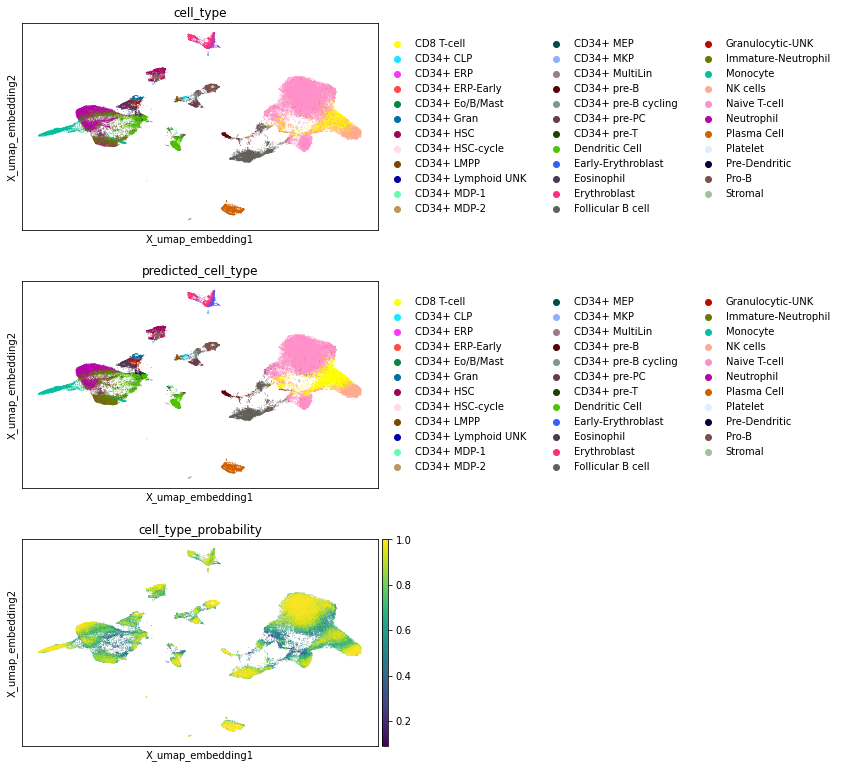

In [25]:
sc.pl.embedding(adata, basis='X_umap_embedding', color=['cell_type', 'predicted_cell_type',
                                                        'cell_type_probability'],
               ncols=1)

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


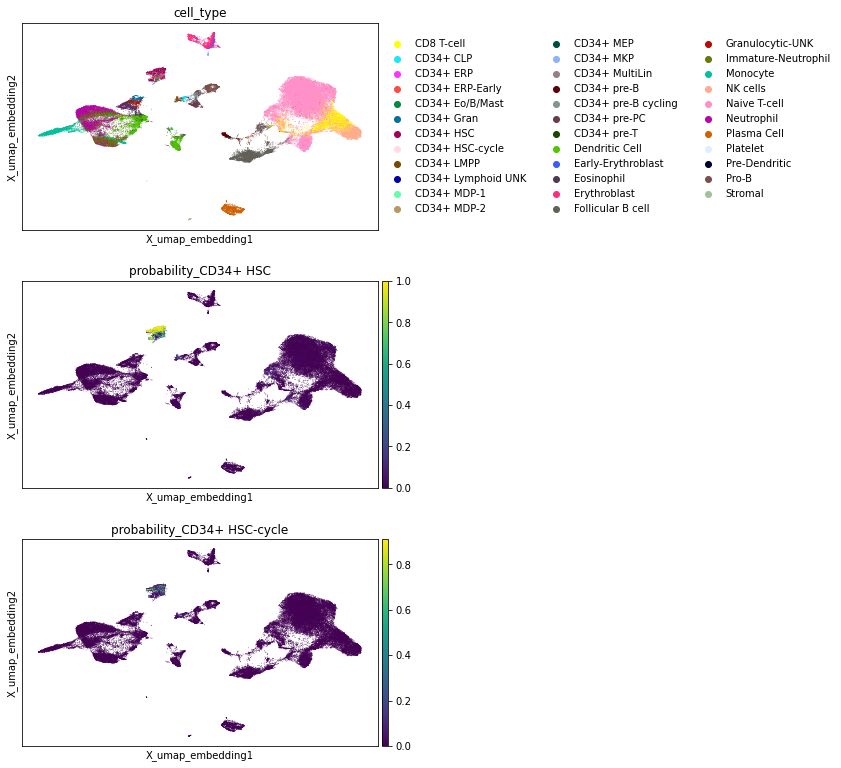

In [63]:
sc.pl.embedding(adata, basis='X_umap_embedding', color=['cell_type',
                                                        'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle'],
               ncols=1)

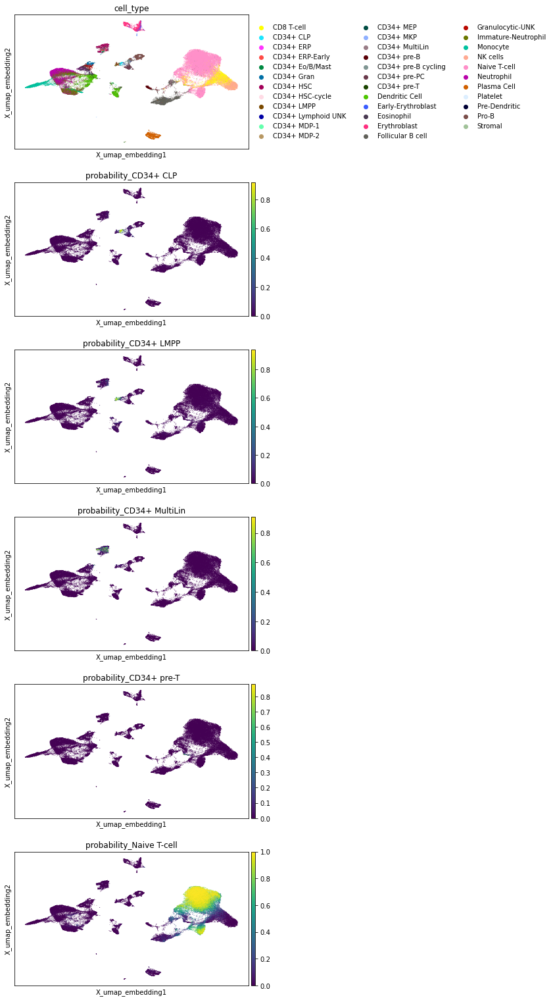

In [64]:
sc.pl.embedding(adata, basis='X_umap_embedding', color=['cell_type',
                                                        'probability_CD34+ CLP', 'probability_CD34+ LMPP',
                                                       'probability_CD34+ MultiLin',
                                                       'probability_CD34+ pre-T',
                                                       'probability_Naive T-cell'],
               ncols=1)

In [26]:
adata.write_h5ad('/home/estorrs/rds_conversion/data/scRNAseq/immune/annotated_processed.h5ad')

In [56]:
# a = sc.read_h5ad('/home/estorrs/data/single_cell_classification/tumor/myeloma/merged.h5ad')
# a

###### breast

In [27]:
brca = sc.read_h5ad('/home/estorrs/pollock/benchmarking/data/11302020_harmonized/teir_1/scRNAseq/brca.h5ad')
brca

AnnData object with n_obs × n_vars = 98564 × 27131
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident'
    var: 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_mean', 'sct.residual_variance', 'sct.variable'
    obsm: 'X_pca', 'X_umap'
    layers: 'logcounts'

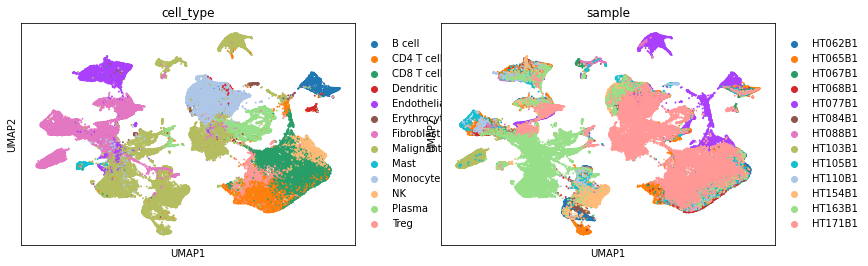

In [34]:
sc.pl.umap(brca, color=['cell_type', 'sample'], size=15, sort_order=)

In [35]:
predictions = predict_from_anndata(brca.copy(), module_fp)
predictions

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 12:06:07,260 31722 genes in training set are missing from prediction set
2020-12-03 12:06:24,852 starting batch 1 of 10
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 12:06:27,340 31722 genes in training set are missing from prediction set
2020-12-03 12:09:40,344 starting batch 2 of 10
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 12:09:41,270 31722 genes in training set are missing from prediction set
2020-12-03 12:14:51,606 starting batch 3 of 10
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 12:14:52,422 31722 genes in training set are missing from prediction set
2020-12-03 12:17:11,603 starting batch 4 of 10
is_categorical is deprecated and will be removed in a future

,predicted_cell_type,cell_type_probability,probability_CD34+ CLP,probability_CD34+ ERP,probability_CD34+ ERP-Early,probability_CD34+ Eo/B/Mast,probability_CD34+ Gran,probability_CD34+ HSC,probability_CD34+ HSC-cycle,probability_CD34+ LMPP,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
cell_id,,,,,,,,,,,,,,,,,,,,,
_HT062B1_S1PA_AAACCCACACAAATGA-1,NK cells,0.58,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.01,...,0.00,0.00,0.58,0.01,0.00,0.00,0.00,0.00,0.00,0.04
_HT062B1_S1PA_AAACCCAGTGCTCCGA-1,Stromal,0.76,0.00,0.00,0.00,0.00,0.0,0.01,0.00,0.00,...,0.00,0.01,0.00,0.02,0.00,0.18,0.00,0.00,0.00,0.76
_HT062B1_S1PA_AAACCCATCGGAATTC-1,Stromal,0.99,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.99
_HT062B1_S1PA_AAACGAACAGCTAACT-1,CD34+ MDP-1,0.13,0.04,0.00,0.01,0.01,0.0,0.00,0.03,0.03,...,0.01,0.00,0.01,0.01,0.01,0.02,0.02,0.09,0.07,0.03
_HT062B1_S1PA_AAACGAAGTAGGGAGG-1,CD8 T-cell,0.46,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.03,0.00,0.27,0.15,0.00,0.02,0.00,0.01,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
_HT171B1_BC2_TTTGTTGCACCAGACC-1,NK cells,0.17,0.00,0.00,0.00,0.00,0.0,0.01,0.00,0.01,...,0.00,0.00,0.17,0.03,0.00,0.03,0.00,0.16,0.01,0.01
_HT171B1_BC2_TTTGTTGCACGTACTA-1,CD34+ MKP,0.23,0.01,0.06,0.05,0.02,0.0,0.04,0.04,0.06,...,0.00,0.00,0.03,0.00,0.00,0.01,0.00,0.05,0.00,0.00
_HT171B1_BC2_TTTGTTGTCCCAAGCG-1,NK cells,0.44,0.01,0.01,0.00,0.00,0.0,0.00,0.00,0.01,...,0.00,0.01,0.44,0.01,0.00,0.02,0.00,0.00,0.00,0.10


In [36]:
brca.obs = pd.merge(brca.obs, predictions, right_index=True, left_index=True)
brca.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,sample,tissue_type,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
_HT062B1_S1PA_AAACCCACACAAATGA-1,TWCE-HT062B1-S1PAA1A1Z1B1,4837.0,1378,0.043829,4154.0,1378,2,2,HT062B1,Tumor tissue,...,0.00,0.00,0.58,0.01,0.00,0.00,0.00,0.00,0.00,0.04
_HT062B1_S1PA_AAACCCAGTGCTCCGA-1,TWCE-HT062B1-S1PAA1A1Z1B1,6400.0,2369,0.061562,4515.0,2344,4,4,HT062B1,Tumor tissue,...,0.00,0.01,0.00,0.02,0.00,0.18,0.00,0.00,0.00,0.76
_HT062B1_S1PA_AAACCCATCGGAATTC-1,TWCE-HT062B1-S1PAA1A1Z1B1,10255.0,2945,0.042321,4558.0,1978,10,10,HT062B1,Tumor tissue,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.99
_HT062B1_S1PA_AAACGAACAGCTAACT-1,TWCE-HT062B1-S1PAA1A1Z1B1,1433.0,751,0.073273,3072.0,801,13,13,HT062B1,Tumor tissue,...,0.01,0.00,0.01,0.01,0.01,0.02,0.02,0.09,0.07,0.03
_HT062B1_S1PA_AAACGAAGTAGGGAGG-1,TWCE-HT062B1-S1PAA1A1Z1B1,2256.0,934,0.050089,3281.0,934,2,2,HT062B1,Tumor tissue,...,0.03,0.00,0.27,0.15,0.00,0.02,0.00,0.01,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
_HT171B1_BC2_TTTGTTGCACCAGACC-1,TWCE-HT171B1-BC2,4717.0,1660,0.063600,4178.0,1660,8,8,HT171B1,Tumor tissue,...,0.00,0.00,0.17,0.03,0.00,0.03,0.00,0.16,0.01,0.01
_HT171B1_BC2_TTTGTTGCACGTACTA-1,TWCE-HT171B1-BC2,4627.0,1441,0.014048,4117.0,1441,1,1,HT171B1,Tumor tissue,...,0.00,0.00,0.03,0.00,0.00,0.01,0.00,0.05,0.00,0.00
_HT171B1_BC2_TTTGTTGTCCCAAGCG-1,TWCE-HT171B1-BC2,3236.0,1392,0.051916,3482.0,1392,8,8,HT171B1,Tumor tissue,...,0.00,0.01,0.44,0.01,0.00,0.02,0.00,0.00,0.00,0.10
_HT171B1_BC2_TTTGTTGTCCTCACCA-1,TWCE-HT171B1-BC2,13163.0,4124,0.036162,3946.0,1808,7,7,HT171B1,Tumor tissue,...,0.01,0.00,0.04,0.00,0.01,0.01,0.02,0.11,0.03,0.17


In [37]:
embeddings = embed_from_anndata(brca.copy(), module_fp)
embeddings

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 12:32:04,293 31722 genes in training set are missing from prediction set
2020-12-03 12:32:06,497 starting batch 1 of 10
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 12:32:06,875 31722 genes in training set are missing from prediction set
2020-12-03 12:33:33,920 starting batch 2 of 10
2020-12-03 12:33:34,325 31722 genes in training set are missing from prediction set
2020-12-03 12:34:59,531 starting batch 3 of 10
2020-12-03 12:34:59,982 31722 genes in training set are missing from prediction set
2020-12-03 12:36:26,950 starting batch 4 of 10
2020-12-03 12:36:27,364 31722 genes in training set are missing from prediction set
2020-12-03 12:37:49,337 starting batch 5 of 10
2020-12-03 12:37:50,486 31722 genes in training set are missing from prediction set
2020-12-03 12:39:21,069 starting batch 6 of 10
2020-1

,CELL_EMBEDDING_1,CELL_EMBEDDING_2,CELL_EMBEDDING_3,CELL_EMBEDDING_4,CELL_EMBEDDING_5,CELL_EMBEDDING_6,CELL_EMBEDDING_7,CELL_EMBEDDING_8,CELL_EMBEDDING_9,CELL_EMBEDDING_10,...,CELL_EMBEDDING_16,CELL_EMBEDDING_17,CELL_EMBEDDING_18,CELL_EMBEDDING_19,CELL_EMBEDDING_20,CELL_EMBEDDING_21,CELL_EMBEDDING_22,CELL_EMBEDDING_23,CELL_EMBEDDING_24,CELL_EMBEDDING_25
_HT062B1_S1PA_AAACCCACACAAATGA-1,-0.419217,0.466826,-0.874704,0.478541,1.461445,-1.046664,0.287755,-0.450905,-0.616077,-0.944109,...,0.466056,-0.586444,0.171206,0.165811,-2.335635,0.205867,-0.273832,-0.465519,-0.190115,0.121235
_HT062B1_S1PA_AAACCCAGTGCTCCGA-1,0.419496,-1.073607,-3.491582,1.669531,1.313867,-2.685859,0.492203,-0.287668,-1.128960,-0.246072,...,-0.754536,-0.473772,1.802431,0.941046,1.135974,-0.947254,0.967951,-2.687268,-1.364777,-0.686189
_HT062B1_S1PA_AAACCCATCGGAATTC-1,-0.130406,-1.453498,-3.143864,2.449933,2.019042,-3.261121,-0.343408,-1.517207,-2.116926,-1.519976,...,-1.810625,-1.326388,2.641584,-0.178003,1.006235,-1.984611,2.506860,-3.407899,-0.880674,-0.991163
_HT062B1_S1PA_AAACGAACAGCTAACT-1,0.860612,0.000793,-0.694440,0.166637,0.039391,-1.176455,0.262915,-0.096101,-0.007086,-0.308349,...,0.476582,0.137155,0.304669,-0.395686,1.270739,-0.746299,-1.007480,-1.165456,-0.340785,-0.332885
_HT062B1_S1PA_AAACGAAGTAGGGAGG-1,-0.591697,0.847101,-0.264190,0.249556,0.702289,-0.609056,0.519034,0.041287,-0.256843,-0.102443,...,0.868528,-0.027320,-0.100700,0.529784,-1.129439,-0.062983,-0.516092,-0.314575,-0.062364,0.584755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
_HT171B1_BC2_TTTGTTGCACCAGACC-1,0.496046,0.659787,-0.928374,0.101833,0.773653,-1.708809,0.416274,-0.011488,-0.656072,-1.135746,...,0.877120,-0.256696,0.177852,-0.514110,-0.832017,-0.459253,-0.796010,-0.673060,0.283405,-0.067720
_HT171B1_BC2_TTTGTTGCACGTACTA-1,1.142425,0.099168,-0.794712,0.181787,-0.542041,-0.638386,-0.294324,-0.163049,0.616498,-0.797948,...,0.193383,0.159565,-0.215547,-0.811676,0.792934,0.353728,-1.013164,-0.755437,-0.205684,-0.150450
_HT171B1_BC2_TTTGTTGTCCCAAGCG-1,-0.026519,0.767773,-1.154247,0.575978,1.451113,-0.690829,0.207880,-0.495899,-0.747497,-1.280480,...,0.598328,-0.668381,0.378768,0.028610,-1.774817,0.104923,0.220640,-0.709847,0.236382,-0.264998
_HT171B1_BC2_TTTGTTGTCCTCACCA-1,1.025835,-0.435850,-1.471693,0.393339,1.253684,-0.934392,-0.161500,0.890204,0.129547,-1.556288,...,0.024735,-0.857276,0.985794,-0.182348,-0.061478,-0.204335,0.796928,-1.382280,-0.153560,-0.480565


In [38]:
brca.obsm['X_embedding'] = embeddings.values

In [39]:
from sklearn.preprocessing import StandardScaler
brca.obsm['X_umap_embedding'] = umap.UMAP().fit_transform(StandardScaler().fit_transform(embeddings.values))

In [41]:
brca.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,sample,tissue_type,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
_HT062B1_S1PA_AAACCCACACAAATGA-1,TWCE-HT062B1-S1PAA1A1Z1B1,4837.0,1378,0.043829,4154.0,1378,2,2,HT062B1,Tumor tissue,...,0.00,0.00,0.58,0.01,0.00,0.00,0.00,0.00,0.00,0.04
_HT062B1_S1PA_AAACCCAGTGCTCCGA-1,TWCE-HT062B1-S1PAA1A1Z1B1,6400.0,2369,0.061562,4515.0,2344,4,4,HT062B1,Tumor tissue,...,0.00,0.01,0.00,0.02,0.00,0.18,0.00,0.00,0.00,0.76
_HT062B1_S1PA_AAACCCATCGGAATTC-1,TWCE-HT062B1-S1PAA1A1Z1B1,10255.0,2945,0.042321,4558.0,1978,10,10,HT062B1,Tumor tissue,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.99
_HT062B1_S1PA_AAACGAACAGCTAACT-1,TWCE-HT062B1-S1PAA1A1Z1B1,1433.0,751,0.073273,3072.0,801,13,13,HT062B1,Tumor tissue,...,0.01,0.00,0.01,0.01,0.01,0.02,0.02,0.09,0.07,0.03
_HT062B1_S1PA_AAACGAAGTAGGGAGG-1,TWCE-HT062B1-S1PAA1A1Z1B1,2256.0,934,0.050089,3281.0,934,2,2,HT062B1,Tumor tissue,...,0.03,0.00,0.27,0.15,0.00,0.02,0.00,0.01,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
_HT171B1_BC2_TTTGTTGCACCAGACC-1,TWCE-HT171B1-BC2,4717.0,1660,0.063600,4178.0,1660,8,8,HT171B1,Tumor tissue,...,0.00,0.00,0.17,0.03,0.00,0.03,0.00,0.16,0.01,0.01
_HT171B1_BC2_TTTGTTGCACGTACTA-1,TWCE-HT171B1-BC2,4627.0,1441,0.014048,4117.0,1441,1,1,HT171B1,Tumor tissue,...,0.00,0.00,0.03,0.00,0.00,0.01,0.00,0.05,0.00,0.00
_HT171B1_BC2_TTTGTTGTCCCAAGCG-1,TWCE-HT171B1-BC2,3236.0,1392,0.051916,3482.0,1392,8,8,HT171B1,Tumor tissue,...,0.00,0.01,0.44,0.01,0.00,0.02,0.00,0.00,0.00,0.10
_HT171B1_BC2_TTTGTTGTCCTCACCA-1,TWCE-HT171B1-BC2,13163.0,4124,0.036162,3946.0,1808,7,7,HT171B1,Tumor tissue,...,0.01,0.00,0.04,0.00,0.01,0.01,0.02,0.11,0.03,0.17


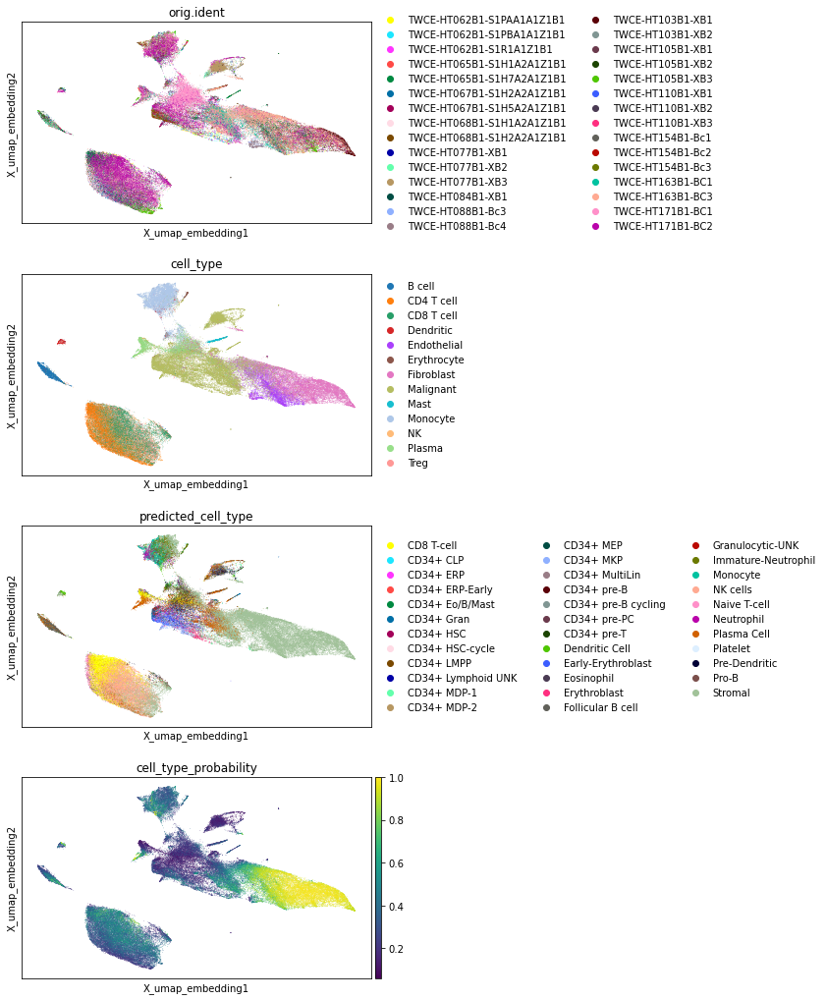

In [42]:
sc.pl.embedding(brca, basis='X_umap_embedding', color=['orig.ident', 'cell_type', 'predicted_cell_type',
                                                        'cell_type_probability'],
               ncols=1)

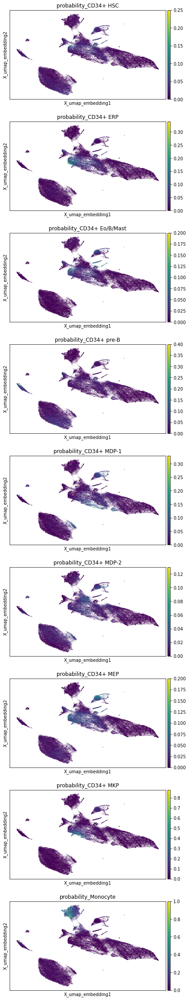

In [107]:
sc.pl.embedding(brca, basis='X_umap_embedding', color=['probability_CD34+ HSC', 'probability_CD34+ ERP',
                                                     'probability_CD34+ Eo/B/Mast', 'probability_CD34+ pre-B',
                                                     'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2',
                                                      'probability_CD34+ MEP', 'probability_CD34+ MKP',
                                                      'probability_Monocyte'],
               ncols=1)

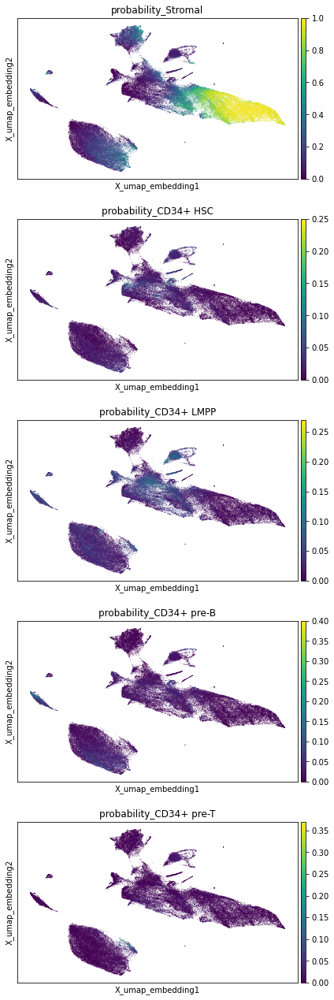

In [43]:
sc.pl.embedding(brca, basis='X_umap_embedding', color=['probability_Stromal', 'probability_CD34+ HSC',
                                                     'probability_CD34+ LMPP', 'probability_CD34+ pre-B',
                                                     'probability_CD34+ pre-T'],
               ncols=1)

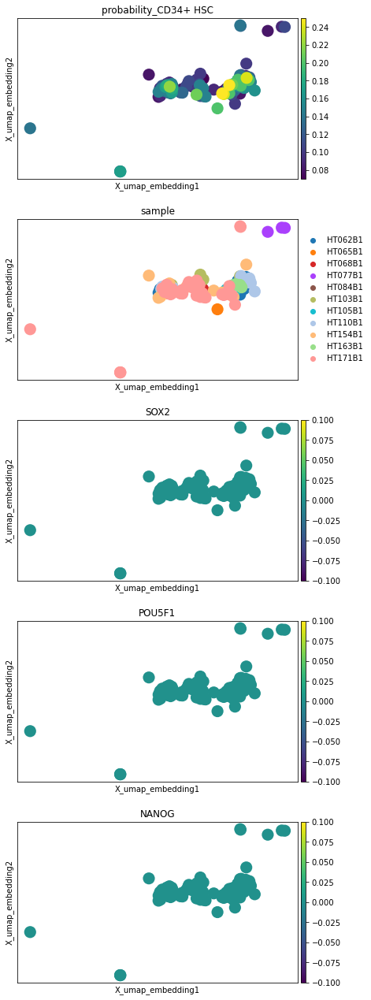

In [48]:
sc.pl.embedding(brca[brca.obs['predicted_cell_type']=='CD34+ HSC'],
                basis='X_umap_embedding', color=['probability_CD34+ HSC',
                                                     'sample'],
               ncols=1)

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


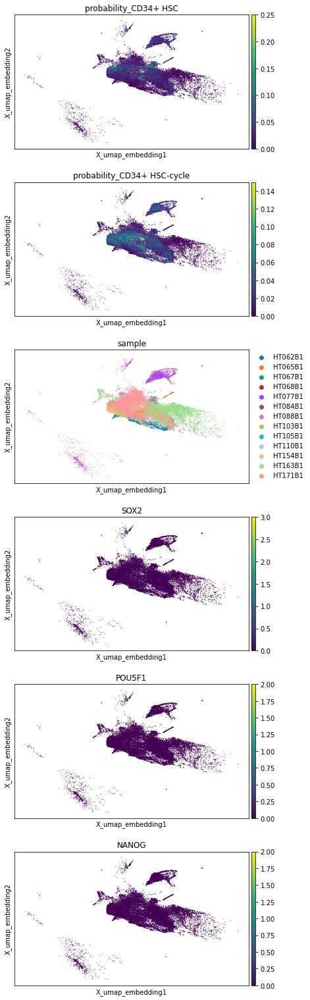

In [62]:
sc.pl.embedding(brca[brca.obs['cell_type']=='Malignant'],
                basis='X_umap_embedding', color=['probability_CD34+ HSC', 'probability_CD34+ HSC-cycle',
                                                     'sample', 'SOX2', 'POU5F1', 'NANOG'],
               ncols=1)

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'label' as categorical


invalid value encountered in log2


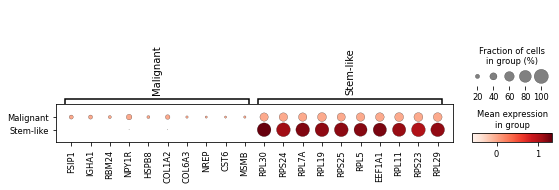

In [52]:
filtered = brca[brca.obs['cell_type']=='Malignant'].copy()
filtered.obs['label'] = ['Stem-like' if x>.1 else 'Malignant' for x in filtered.obs['probability_CD34+ HSC']]
sc.pp.log1p(filtered)
sc.pp.scale(filtered)
# sc.pp.neighbors(filtered)
# sc.pp.pca(filtered)

# sc.tl.umap(feature_adata)
# sc.tl.leiden(feature_adata, resolution=1.)

sc.tl.rank_genes_groups(filtered, groupby='label')
sc.pl.rank_genes_groups_dotplot(filtered)

In [53]:
explain, rest = balancedish_training_generator(brca, cell_type_key='predicted_cell_type', n_per_cell_type=20,
                                               oversample=False,
                                        split=1.)
background, _ = balancedish_training_generator(rest, cell_type_key='predicted_cell_type', n_per_cell_type=5,
                                               oversample=False,
                                           split=1.)
explain

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


View of AnnData object with n_obs × n_vars = 681 × 27131
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident', 'predicted_cell_type', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probabili

In [54]:
w = explain_predictions(explain.copy(), background.copy(), module_fp, prediction_key='predicted_cell_type')
w

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 17:44:45,945 31722 genes in training set are missing from prediction set
2020-12-03 17:44:47,013 starting batch 1 of 1
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-03 17:44:47,182 31722 genes in training set are missing from prediction set
2020-12-03 17:44:52,415 31722 genes in training set are missing from prediction set
2020-12-03 17:44:56,404 (681, 58347)


,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,BX005132.2,AL645728.2,PDE11A-1,AL163152.1,AL139254.3,AL591163.1,AL589702.1,AC068587.10,AL034417.4,AL513220.1
_HT062B1_S1PA_AATGAAGGTACCCGAC-1,0.000019,0.0,0.000076,0.0,2.130380e-05,4.204788e-07,0.000005,0.000052,6.161882e-06,0.000002,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
_HT062B1_S1PA_ACGGAAGGTTCTCCCA-1,0.000009,0.0,0.000067,0.0,3.015234e-05,3.377286e-06,0.000004,0.000013,1.083385e-05,0.000002,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
_HT062B1_S1PA_CAGGGCTAGCACCAGA-1,0.000841,0.0,0.000170,0.0,8.651823e-07,1.692720e-05,0.000002,0.000010,1.889384e-06,0.000002,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
_HT062B1_S1PA_CCGATGGCATACAGGG-1,0.000022,0.0,0.000067,0.0,1.880662e-07,3.481210e-05,0.000008,0.000023,1.409021e-07,0.000004,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
_HT062B1_S1PA_CCTTCAGTCGGCATTA-1,0.000012,0.0,0.000018,0.0,3.252996e-05,1.944447e-05,0.000008,0.000027,2.448518e-06,0.000003,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
_HT171B1_BC2_TTCCTAATCGAGATGG-1,0.000053,0.0,0.000130,0.0,2.963550e-05,2.270422e-05,0.000021,0.000063,1.624008e-05,0.000001,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
_HT171B1_BC2_TTCGATTTCGTTCAGA-1,0.000015,0.0,0.000072,0.0,6.393842e-06,6.002576e-06,0.000010,0.000017,2.320447e-07,0.000005,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
_HT171B1_BC2_TTCGCTGCAAGAGCTG-1,0.000027,0.0,0.000039,0.0,1.031766e-05,1.231306e-05,0.000006,0.000009,1.570283e-05,0.000010,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
_HT171B1_BC2_TTGGATGCATCTCGTC-1,0.000051,0.0,0.000017,0.0,3.374992e-04,1.266278e-04,0.000009,0.000018,1.193533e-07,0.000014,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [55]:
tumor_weights = anndata.AnnData(X=w.values, obs=explain.obs.copy())
tumor_weights.var.index = w.columns
tumor_weights

AnnData object with n_obs × n_vars = 681 × 58347
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident', 'predicted_cell_type', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probability_Eosin

In [56]:
feature_adata = tumor_weights.copy()

# feature_adata.obsm['X_umap'] = umap.UMAP().fit_transform(StandardScaler().fit_transform(feature_adata.X))


sc.pp.scale(feature_adata)
sc.pp.neighbors(feature_adata)
sc.pp.pca(feature_adata)

sc.tl.umap(feature_adata)
sc.tl.leiden(feature_adata, resolution=1.)
feature_adata

         Falling back to preprocessing with `sc.pp.pca` and default params.


AnnData object with n_obs × n_vars = 681 × 58347
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident', 'predicted_cell_type', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probability_Eosin

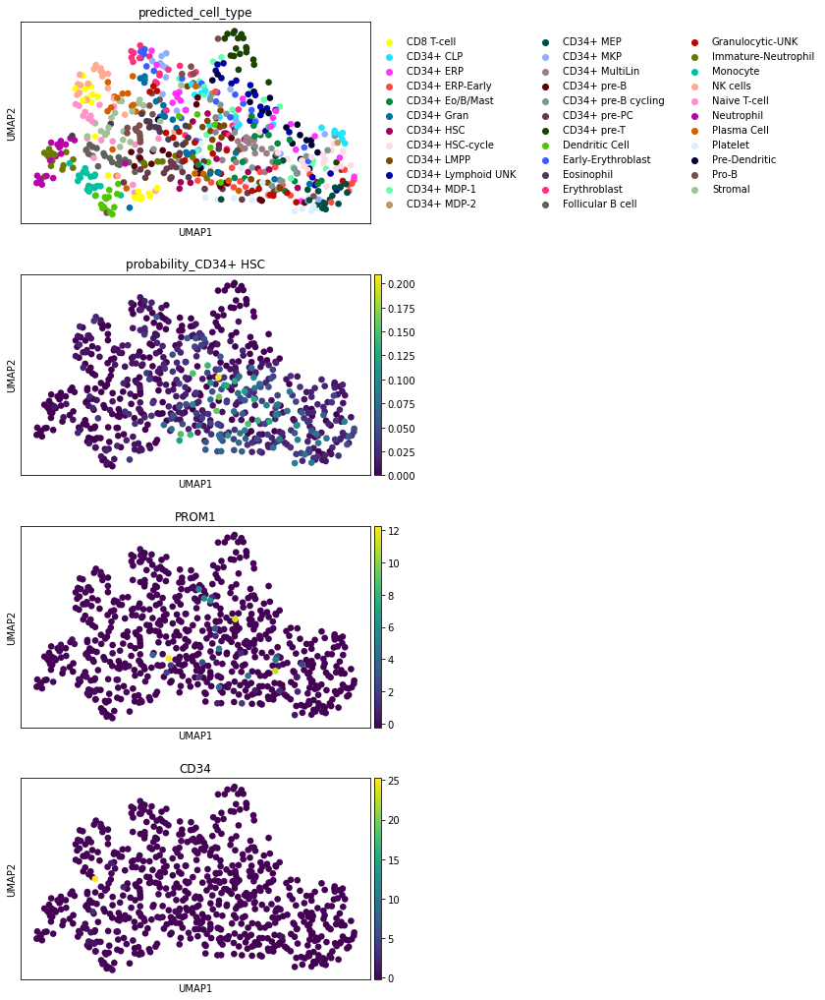

In [61]:
sc.pl.umap(feature_adata, color=['predicted_cell_type', 'probability_CD34+ HSC', 'PROM1', 'CD34'],
          ncols=1)

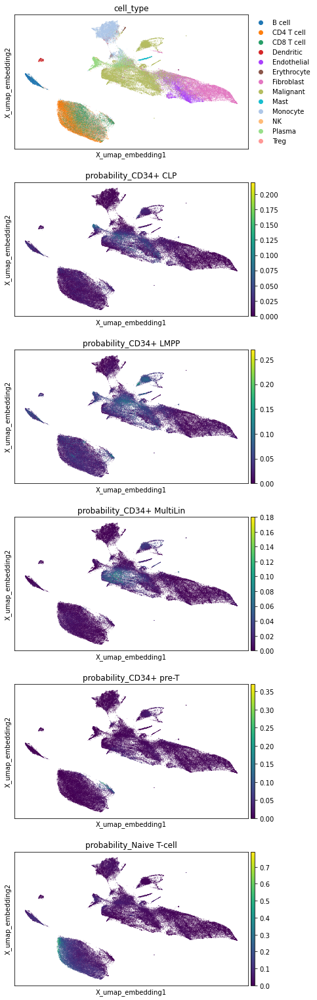

In [65]:
sc.pl.embedding(brca, basis='X_umap_embedding', color=['cell_type',
                                                        'probability_CD34+ CLP', 'probability_CD34+ LMPP',
                                                       'probability_CD34+ MultiLin',
                                                       'probability_CD34+ pre-T',
                                                       'probability_Naive T-cell'],
               ncols=1)

In [ ]:
sc.pl.embedding(brca, basis='X_umap_embedding', color=['cell_type',
                                                        'probability_CD34+'],
               ncols=1)

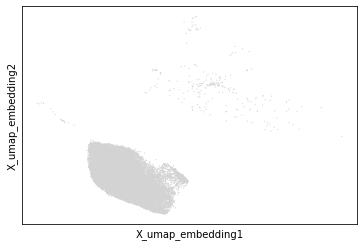

In [67]:
filtered = brca[[True if c in ['CD4 T cell', 'CD8 T cell'] else False for c in brca.obs['cell_type']]]
sc.pl.embedding(filtered, basis='X_umap_embedding')

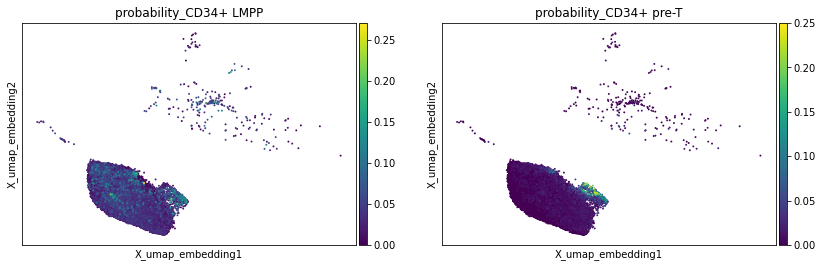

In [69]:
sc.pl.embedding(filtered, basis='X_umap_embedding', color=['probability_CD34+ LMPP', 'probability_CD34+ pre-T'],
               size=15)

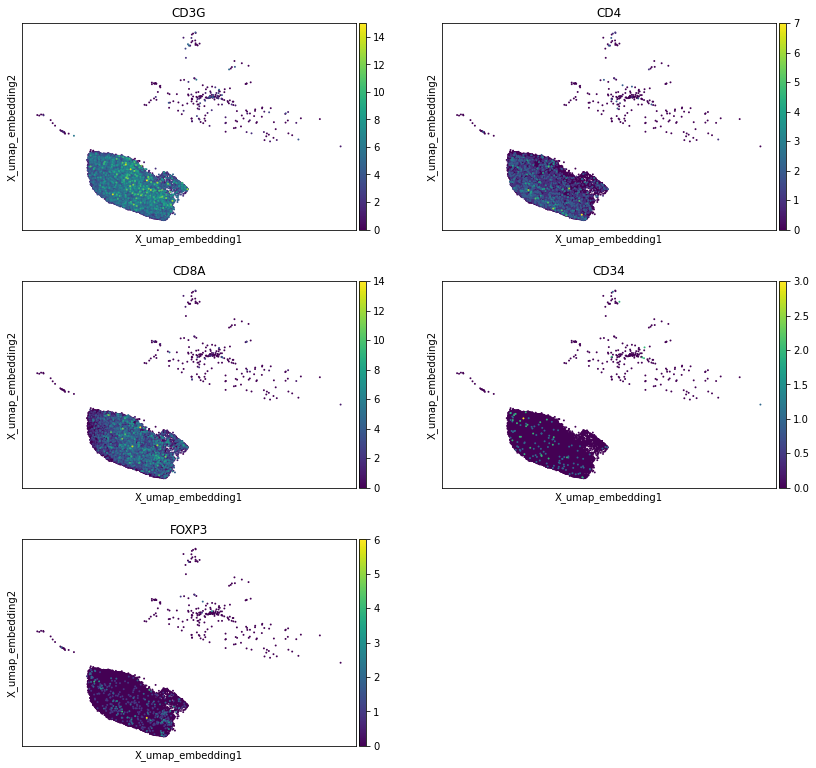

In [76]:
sc.pl.embedding(filtered, basis='X_umap_embedding', color=['CD3G', 'CD4', 'CD8A', 'CD34', 'FOXP3'],
                ncols=2,
               size=15)

In [85]:
Counter(small.obs['predicted_cell_type'])

Counter({'Stromal': 2,
         'NK cells': 15,
         'Naive T-cell': 19,
         'Follicular B cell': 6,
         'Plasma Cell': 3,
         'CD8 T-cell': 9,
         'Pro-B': 6,
         'CD34+ pre-T': 7,
         'CD34+ LMPP': 1,
         'CD34+ pre-B cycling': 1,
         'CD34+ CLP': 1,
         'Immature-Neutrophil': 1,
         'CD34+ Lymphoid UNK': 1})

In [95]:
small.obs['probability_CD34+ pre-T']

_HT062B1_S1PA_CCGATGGCATACAGGG-1    0.00
_HT062B1_S1PA_CCTTCAGTCGGCATTA-1    0.00
_HT062B1_S1PA_TACGCTCAGCTCGAAG-1    0.00
_HT062B1_S1PA_TGAGTCAAGGGATCGT-1    0.00
_HT062B1_S1R1_ACGTACAGTTAACCTG-1    0.00
                                    ... 
_HT171B1_BC2_GAATCACGTCCGATCG-1     0.00
_HT171B1_BC2_GTAACCATCAACCGAT-1     0.09
_HT171B1_BC2_GTTGCTCTCGCCTTGT-1     0.03
_HT171B1_BC2_TCATGCCCAATAGTGA-1     0.17
_HT171B1_BC2_TGCGGGTGTATGTCCA-1     0.13
Name: probability_CD34+ pre-T, Length: 72, dtype: float64

Trying to set attribute `.obs` of view, copying.
... storing 'groups' as categorical


categories: CD4/CD8/Treg, pre-T
var_group_labels: pre-T


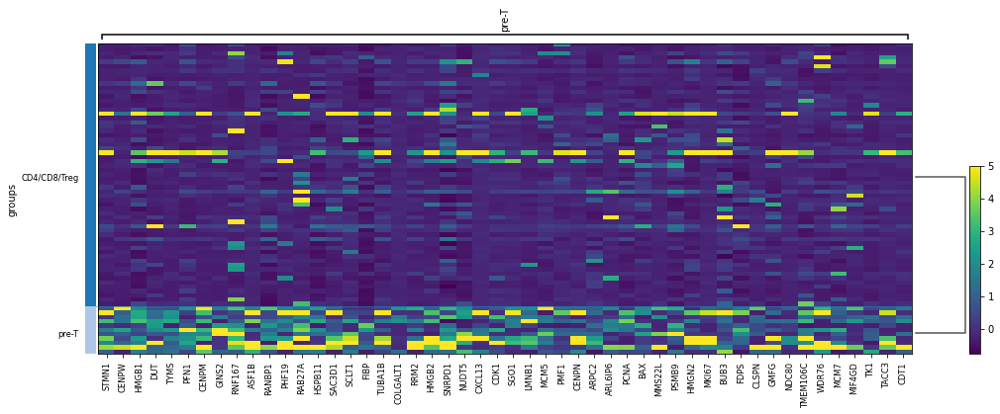

In [103]:
small = feature_adata[[True if c in ['CD4 T cell', 'CD8 T cell'] else False for c in feature_adata.obs['cell_type']]]
# small.obs['groups'] = [x if x=='CD34+ pre-T' else 'other' for x in small.obs['predicted_cell_type']]
small.obs['groups'] = ['pre-T' if x>.05 else 'CD4/CD8/Treg' for x in small.obs['probability_CD34+ pre-T']]

sc.tl.rank_genes_groups(small, groupby='groups', method='wilcoxon')
sc.pl.rank_genes_groups_heatmap(small, groups=['pre-T'], n_genes=50, vmax=5)

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


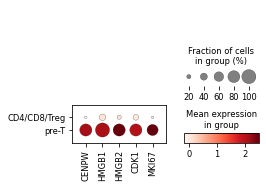

In [105]:
genes = ['CENPW', 'HMGB1', 'HMGB2', 'CDK1', 'MKI67']
sc.pl.dotplot(small, var_names=genes, groupby='groups',)

In [ ]:
small = feature_adata[[True if c in ['CD4 T cell', 'CD8 T cell'] else False for c in feature_adata.obs['cell_type']]]
# small.obs['groups'] = [x if x=='CD34+ pre-T' else 'other' for x in small.obs['predicted_cell_type']]
small.obs['groups'] = ['pre-T' if x>.05 else 'CD4/CD8/Treg' for x in small.obs['probability_CD34+ pre-T']]

sc.tl.rank_genes_groups(small, groupby='groups', method='wilcoxon')
sc.pl.rank_genes_groups_heatmap(small, groups=['pre-T'], n_genes=50, vmax=5)

In [109]:
feature_adata.write_h5ad('/home/estorrs/pollock/benchmarking/sandbox/figure_data/brca_feature_weights.h5ad')

In [110]:
brca.write_h5ad('/home/estorrs/pollock/benchmarking/sandbox/figure_data/brca_predicted.h5ad')

###### mmy

In [111]:
mmy = sc.read_h5ad('/home/estorrs/data/single_cell_classification/tumor/myeloma/merged.h5ad')
mmy

AnnData object with n_obs × n_vars = 108187 × 24020
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'sample', 'predicted_cell_type', 'probability', 'new.ident', 'ident'
    layers: 'logcounts'

In [112]:
Counter(mmy.obs['cell_type'])

Counter({'Plasma': 12744,
         'CD8+T': 11512,
         'CD14+Mono': 19865,
         'CD4+T': 27756,
         'B': 5850,
         'NA': 15453,
         'DC': 705,
         'NK': 7793,
         'CD16+Mono': 4247,
         'monocytes': 281,
         'unknown': 63,
         'neutrophil': 76,
         'macrophages': 23,
         'Erythrocytes': 101,
         'Monocytes': 1050,
         'B(2)': 192,
         'Neutrophils': 148,
         'Macrophages(2)': 123,
         'B(1)': 31,
         'Platelet': 16,
         'Macrophages(1)': 48,
         'Mast cells': 17,
         'Macrophages(3)': 2,
         'unknown(CD34+CYTL1+)': 1,
         'pDC': 74,
         'Plasma_BM': 16})

In [113]:
set(mmy.X[:1].toarray().flatten())

{0.0,
 1.0,
 2.0,
 3.0,
 4.0,
 5.0,
 6.0,
 7.0,
 8.0,
 9.0,
 10.0,
 11.0,
 12.0,
 14.0,
 15.0,
 16.0,
 17.0,
 19.0,
 21.0,
 22.0,
 23.0,
 26.0,
 52.0,
 102.0,
 604.0,
 1042.0}

In [114]:
predictions = predict_from_anndata(mmy.copy(), module_fp)
predictions

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 10:54:36,688 38645 genes in training set are missing from prediction set
2020-12-04 10:54:37,713 starting batch 1 of 11
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 10:54:37,923 38645 genes in training set are missing from prediction set
2020-12-04 10:55:29,606 starting batch 2 of 11
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 10:55:30,295 38645 genes in training set are missing from prediction set
2020-12-04 10:56:25,384 starting batch 3 of 11
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 10:56:25,737 38645 genes in training set are missing from prediction set
2020-12-04 10:57:19,234 starting batch 4 of 11
is_categorical is deprecated and will be removed in a future

,predicted_cell_type,cell_type_probability,probability_CD34+ CLP,probability_CD34+ ERP,probability_CD34+ ERP-Early,probability_CD34+ Eo/B/Mast,probability_CD34+ Gran,probability_CD34+ HSC,probability_CD34+ HSC-cycle,probability_CD34+ LMPP,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
cell_id,,,,,,,,,,,,,,,,,,,,,
25183_AAACCTGAGTTAACGA-1,Plasma Cell,0.36,0.00,0.01,0.00,0.00,0.01,0.00,0.01,0.04,...,0.00,0.00,0.09,0.00,0.00,0.36,0.00,0.01,0.01,0.22
25183_AAACCTGTCAACTCTT-1,Plasma Cell,0.24,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.04,...,0.04,0.00,0.05,0.02,0.04,0.24,0.01,0.02,0.01,0.04
25183_AAACGGGAGAGACGAA-1,Granulocytic-UNK,0.21,0.04,0.10,0.04,0.03,0.09,0.01,0.00,0.03,...,0.03,0.00,0.00,0.06,0.05,0.01,0.00,0.01,0.00,0.00
25183_AAACGGGAGCTTCGCG-1,Plasma Cell,0.62,0.00,0.00,0.00,0.02,0.02,0.01,0.01,0.00,...,0.01,0.00,0.03,0.01,0.01,0.62,0.00,0.00,0.00,0.05
25183_AAACGGGCACAGCCCA-1,Plasma Cell,0.49,0.00,0.00,0.00,0.01,0.00,0.03,0.00,0.04,...,0.01,0.00,0.07,0.02,0.00,0.49,0.01,0.00,0.00,0.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Normal_sorted_170607_GTGCAGCTCTCTAGGA-1,Granulocytic-UNK,0.12,0.04,0.06,0.00,0.03,0.03,0.02,0.01,0.05,...,0.05,0.00,0.00,0.04,0.03,0.05,0.00,0.02,0.01,0.00
Normal_sorted_170607_TACTTGTCAAGGACTG-1,Granulocytic-UNK,0.12,0.05,0.06,0.02,0.02,0.05,0.01,0.00,0.03,...,0.05,0.00,0.03,0.02,0.04,0.01,0.01,0.03,0.01,0.00
Normal_sorted_170607_TCAGCTCTCAGTCAGT-1,CD8 T-cell,0.09,0.06,0.06,0.00,0.02,0.00,0.02,0.01,0.07,...,0.04,0.00,0.04,0.02,0.03,0.04,0.01,0.06,0.01,0.01


In [115]:
mmy.obs = pd.merge(mmy.obs, predictions, right_index=True, left_index=True)
mmy.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,sample,...,probability_Immature-Neutrophil,probability_Monocyte,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal
25183_AAACCTGAGTTAACGA-1,25183,9680.0,1669,0.018492,3721.0,1140,0,0,Plasma,NA,...,0.00,0.00,0.09,0.00,0.00,0.36,0.00,0.01,0.01,0.22
25183_AAACCTGTCAACTCTT-1,25183,2311.0,559,0.047166,3282.0,554,5,5,Plasma,NA,...,0.04,0.00,0.05,0.02,0.04,0.24,0.01,0.02,0.01,0.04
25183_AAACGGGAGAGACGAA-1,25183,3567.0,229,0.019064,3507.0,229,2,2,Plasma,NA,...,0.03,0.00,0.00,0.06,0.05,0.01,0.00,0.01,0.00,0.00
25183_AAACGGGAGCTTCGCG-1,25183,5664.0,1389,0.019421,3874.0,1374,1,1,Plasma,NA,...,0.01,0.00,0.03,0.01,0.01,0.62,0.00,0.00,0.00,0.05
25183_AAACGGGCACAGCCCA-1,25183,4208.0,955,0.023527,3648.0,951,2,2,Plasma,NA,...,0.01,0.00,0.07,0.02,0.00,0.49,0.01,0.00,0.00,0.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Normal_sorted_170607_GTGCAGCTCTCTAGGA-1,Normal_sorted_170607,1238.0,247,0.010501,2243.0,292,12,12,B,NA,...,0.05,0.00,0.00,0.04,0.03,0.05,0.00,0.02,0.01,0.00
Normal_sorted_170607_TACTTGTCAAGGACTG-1,Normal_sorted_170607,1216.0,248,0.003289,2171.0,294,12,12,Plasma_BM,NA,...,0.05,0.00,0.03,0.02,0.04,0.01,0.01,0.03,0.01,0.00
Normal_sorted_170607_TCAGCTCTCAGTCAGT-1,Normal_sorted_170607,3315.0,376,0.002112,2741.0,361,12,12,Plasma_BM,NA,...,0.04,0.00,0.04,0.02,0.03,0.04,0.01,0.06,0.01,0.01
Normal_sorted_170607_TGACAACAGGACATTA-1,Normal_sorted_170607,2051.0,609,0.010726,2338.0,601,12,12,B,NA,...,0.12,0.02,0.03,0.13,0.02,0.12,0.01,0.01,0.01,0.01


In [116]:
embeddings = embed_from_anndata(mmy.copy(), module_fp)
embeddings

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 11:04:26,731 38645 genes in training set are missing from prediction set
2020-12-04 11:04:27,769 starting batch 1 of 11
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 11:04:28,000 38645 genes in training set are missing from prediction set
2020-12-04 11:05:19,086 starting batch 2 of 11
2020-12-04 11:05:19,798 38645 genes in training set are missing from prediction set
2020-12-04 11:06:15,845 starting batch 3 of 11
2020-12-04 11:06:16,156 38645 genes in training set are missing from prediction set
2020-12-04 11:07:08,715 starting batch 4 of 11
2020-12-04 11:07:08,946 38645 genes in training set are missing from prediction set
2020-12-04 11:08:09,156 starting batch 5 of 11
2020-12-04 11:08:09,544 38645 genes in training set are missing from prediction set
2020-12-04 11:09:09,652 starting batch 6 of 11
2020-1

,CELL_EMBEDDING_1,CELL_EMBEDDING_2,CELL_EMBEDDING_3,CELL_EMBEDDING_4,CELL_EMBEDDING_5,CELL_EMBEDDING_6,CELL_EMBEDDING_7,CELL_EMBEDDING_8,CELL_EMBEDDING_9,CELL_EMBEDDING_10,...,CELL_EMBEDDING_16,CELL_EMBEDDING_17,CELL_EMBEDDING_18,CELL_EMBEDDING_19,CELL_EMBEDDING_20,CELL_EMBEDDING_21,CELL_EMBEDDING_22,CELL_EMBEDDING_23,CELL_EMBEDDING_24,CELL_EMBEDDING_25
25183_AAACCTGAGTTAACGA-1,0.476665,0.142549,-1.066095,0.482151,0.602914,-0.350333,-0.079512,-0.623088,-0.401545,-0.665825,...,0.218012,-0.451454,0.507383,0.435858,0.082889,0.067983,-0.378973,-0.823731,-0.602887,-0.279543
25183_AAACCTGTCAACTCTT-1,0.274006,0.011042,-0.465651,0.253604,0.383561,0.151433,-0.133513,-0.153649,-0.101520,-0.256256,...,-0.181903,-0.289966,0.233465,0.562791,0.207232,-0.003163,-0.091075,-0.513121,0.060912,-0.030113
25183_AAACGGGAGAGACGAA-1,-0.036036,0.225079,0.173819,-0.014286,-0.024832,0.262767,0.017024,0.170990,0.034348,0.202562,...,0.148883,0.055644,-0.175368,0.339794,0.062668,0.078410,-0.166289,0.052873,0.093818,0.235947
25183_AAACGGGAGCTTCGCG-1,0.428933,0.527579,-0.497677,0.203604,0.261834,-0.502633,-0.121098,-0.661551,-0.523553,0.069849,...,0.371105,0.095299,0.204084,0.603568,1.144540,0.070426,-1.027751,-1.331244,-0.099229,0.119295
25183_AAACGGGCACAGCCCA-1,0.495549,0.428594,-0.893235,0.082512,0.267136,-0.101305,-0.170599,-0.484314,-0.405986,-0.324071,...,-0.039829,0.062784,0.425664,0.494730,0.732533,0.274113,-0.493291,-0.696667,-0.112226,-0.080558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Normal_sorted_170607_GTGCAGCTCTCTAGGA-1,0.082490,0.141906,0.148631,0.049247,0.011704,0.198286,-0.016599,0.078955,-0.001030,0.126452,...,0.054759,0.049376,-0.026910,0.321224,0.088891,0.046329,-0.151296,-0.057794,0.077766,0.172939
Normal_sorted_170607_TACTTGTCAAGGACTG-1,-0.033196,0.227596,0.106742,-0.097584,0.001919,0.090801,0.095595,0.042234,-0.004173,0.137303,...,-0.032709,0.055604,-0.104974,0.294749,0.039792,0.055965,-0.169714,-0.003546,0.070040,0.115106
Normal_sorted_170607_TCAGCTCTCAGTCAGT-1,-0.102511,0.242972,0.079120,-0.070640,-0.022451,0.122202,0.050303,-0.052648,-0.042706,0.150766,...,0.044456,0.006569,0.003076,0.193659,0.178371,0.068683,-0.244369,-0.129172,0.138885,0.106434
Normal_sorted_170607_TGACAACAGGACATTA-1,0.114010,0.191631,-0.090226,0.092641,0.205514,0.193445,-0.042512,-0.011134,-0.117545,0.025967,...,-0.087484,-0.014676,0.146275,0.573314,0.319373,0.012745,-0.232688,-0.396149,0.102789,0.037424


In [117]:
mmy.obsm['X_embedding'] = embeddings.values

In [118]:
from sklearn.preprocessing import StandardScaler
mmy.obsm['X_umap_embedding'] = umap.UMAP().fit_transform(StandardScaler().fit_transform(embeddings.values))

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'predicted_cell_type_y' as categorical


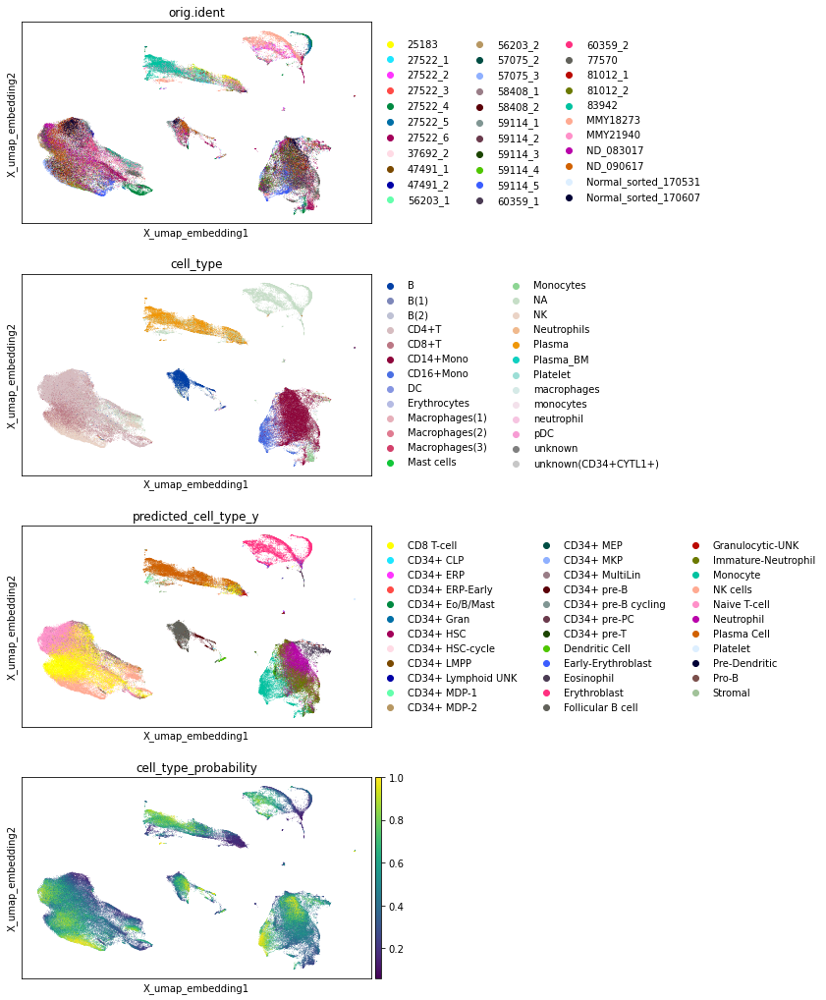

In [119]:
sc.pl.embedding(mmy, basis='X_umap_embedding', color=['orig.ident', 'cell_type', 'predicted_cell_type_y',
                                                        'cell_type_probability'],
               ncols=1)

In [ ]:
to_explain = ['CD8 T-cell', 'CD34+ CLP', 'CD34+ HSC', 'CD34+ LMPP', 'CD34+ MDP-1',
             'CD34+ pre-B', 'CD34+ pre-PC', 'CD34+ pre-T', 'Dendritic', 'Erythroblast',
             'Follicular B cell', ]

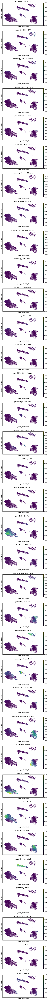

In [122]:
sc.pl.embedding(mmy, basis='X_umap_embedding', color=[c for c in mmy.obs.columns if 'probability_' in c],
               ncols=1)

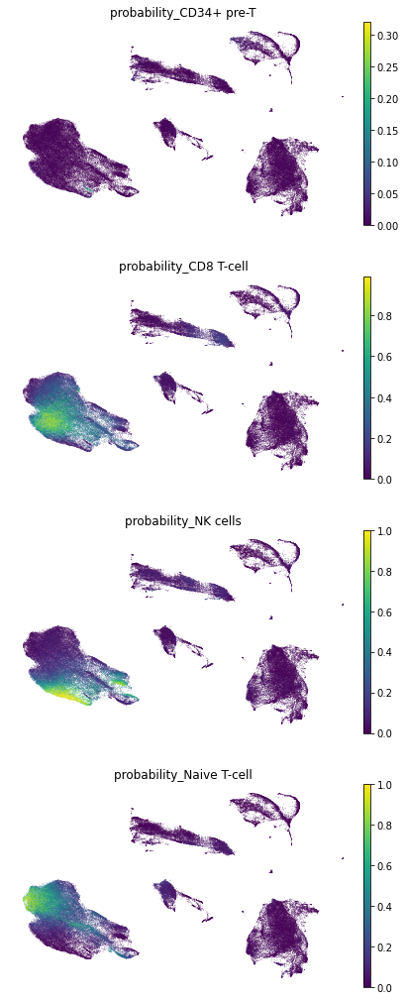

In [169]:
sc.pl.embedding(mmy, basis='X_umap_embedding', color=['probability_CD34+ pre-T',
                                                     'probability_CD8 T-cell',
                                                     'probability_NK cells',
                                                     'probability_Naive T-cell',
                                                 ],
               frameon=False, ncols=1)

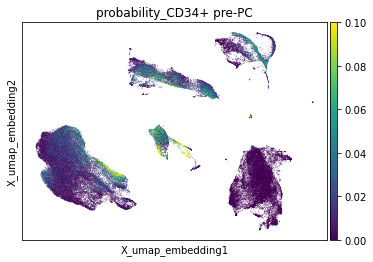

In [123]:
sc.pl.embedding(mmy, basis='X_umap_embedding', color=['probability_CD34+ pre-PC'], vmax=.1,
               ncols=1)

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


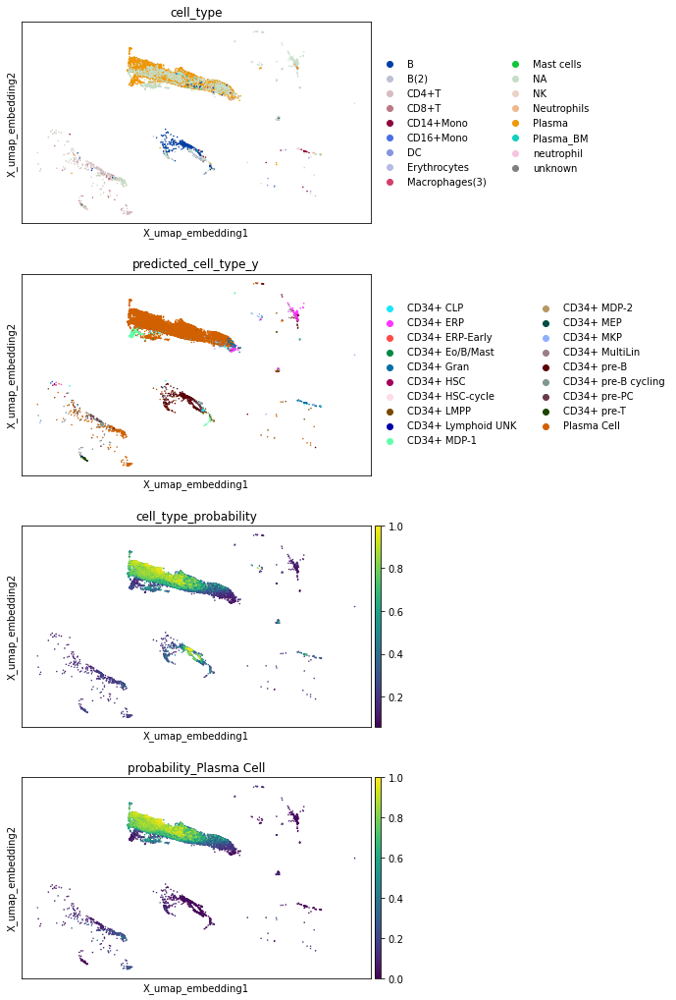

In [121]:

# filtered = mmy[[True if c in ['Plasma', 'Plasma_BM'] else False for c in mmy.obs['cell_type']]]
filtered = mmy[[True if (c in ['Plasma Cell', 'pro-B'] or 'CD34+' in c) else False
                for c in mmy.obs['predicted_cell_type_y']]]
sc.pl.embedding(filtered, basis='X_umap_embedding', color=['cell_type', 'predicted_cell_type_y',
                                                        'cell_type_probability',
                                                          'probability_Plasma Cell'],
               ncols=1)

In [124]:
explain, rest = balancedish_training_generator(mmy, cell_type_key='predicted_cell_type_y',
                                               n_per_cell_type=50, oversample=False,
                                        split=1.)
background, _ = balancedish_training_generator(rest, cell_type_key='predicted_cell_type_y', n_per_cell_type=5,
                                               oversample=False,
                                           split=1.)
explain.shape, background.shape

((1419, 24020), (126, 24020))

In [106]:
# explain.obs['explain_key'] = 'CD34+ HSC'

Trying to set attribute `.obs` of view, copying.


In [125]:
w = explain_predictions(explain.copy(), background.copy(), module_fp, prediction_key='predicted_cell_type_y')
w

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 16:07:59,272 38645 genes in training set are missing from prediction set
2020-12-04 16:08:00,304 starting batch 1 of 1
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-12-04 16:08:00,467 38645 genes in training set are missing from prediction set
2020-12-04 16:08:08,150 38645 genes in training set are missing from prediction set
2020-12-04 16:08:15,371 (1419, 58347)


,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,BX005132.2,AL645728.2,PDE11A-1,AL163152.1,AL139254.3,AL591163.1,AL589702.1,AC068587.10,AL034417.4,AL513220.1
25183_AAACGGGAGAGACGAA-1,0.0,0.0,0.000010,0.000019,0.0,0.000056,9.090383e-07,1.688925e-05,2.767847e-06,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_ACATCAGGTGAGTATA-1,0.0,0.0,0.000012,0.000022,0.0,0.000078,1.026519e-06,6.868914e-06,3.659180e-07,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_ACTGAGTGTTAAGATG-1,0.0,0.0,0.000044,0.000028,0.0,0.000014,1.235159e-06,5.732949e-06,9.597891e-06,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_ACTTTCATCATGGTCA-1,0.0,0.0,0.000029,0.000107,0.0,0.000045,5.269722e-06,3.556000e-04,1.358747e-06,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_AGCTTGAAGGGCTCTC-1,0.0,0.0,0.000011,0.000006,0.0,0.000056,7.202052e-06,4.017765e-04,2.176890e-05,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Normal_sorted_170607_CAAGATCTCTGGTGTA-1,0.0,0.0,0.000022,0.000009,0.0,0.000023,5.653166e-06,3.100903e-05,1.692487e-06,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Normal_sorted_170607_AAGCCGCGTTAGATGA-1,0.0,0.0,0.000012,0.000012,0.0,0.000024,5.532019e-06,3.341926e-07,1.008707e-05,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Normal_sorted_170607_CGATTGAAGACAATAC-1,0.0,0.0,0.000039,0.000006,0.0,0.000039,5.684138e-06,1.047523e-05,2.171736e-05,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Normal_sorted_170607_TACCTATGTACCATCA-1,0.0,0.0,0.000002,0.000006,0.0,0.000063,4.439040e-06,2.293042e-05,3.863564e-06,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:
weights = anndata.AnnData(X=w.values, obs=explain.obs.copy())
weights.var.index = w.columns
weights

AnnData object with n_obs × n_vars = 1419 × 58347
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'sample', 'predicted_cell_type_x', 'probability', 'new.ident', 'ident', 'predicted_cell_type_y', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probability_Eosinophil', 'probability_Erythroblast', 'probability_Follicular B cel

In [127]:
feature_adata = weights.copy()

sc.pp.scale(feature_adata)
sc.pp.neighbors(feature_adata, n_neighbors=5, n_pcs=40)
sc.pp.pca(feature_adata)

sc.tl.umap(feature_adata, min_dist=.5)
sc.tl.leiden(feature_adata, resolution=.3)
feature_adata

         Falling back to preprocessing with `sc.pp.pca` and default params.


AnnData object with n_obs × n_vars = 1419 × 58347
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'sample', 'predicted_cell_type_x', 'probability', 'new.ident', 'ident', 'predicted_cell_type_y', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probability_Eosinophil', 'probability_Erythroblast', 'probability_Follicular B cel

In [128]:
feature_adata.write('/home/estorrs/pollock/benchmarking/sandbox/figure_data/mmy_feature_explainations.h5ad')

In [129]:
mmy.write('/home/estorrs/pollock/benchmarking/sandbox/figure_data/mmy_predicted.h5ad')

In [132]:
Counter(feature_adata.obs['predicted_cell_type_y'])

Counter({'Granulocytic-UNK': 50,
         'Plasma Cell': 50,
         'CD34+ Gran': 50,
         'Stromal': 50,
         'CD34+ MEP': 11,
         'Eosinophil': 50,
         'CD34+ LMPP': 50,
         'CD34+ pre-PC': 50,
         'CD34+ ERP': 50,
         'Pre-Dendritic': 50,
         'Dendritic Cell': 50,
         'CD34+ HSC-cycle': 7,
         'CD34+ CLP': 49,
         'Follicular B cell': 50,
         'Immature-Neutrophil': 50,
         'Early-Erythroblast': 50,
         'CD34+ MKP': 50,
         'CD34+ pre-B cycling': 50,
         'Monocyte': 50,
         'Neutrophil': 50,
         'CD34+ MultiLin': 11,
         'CD8 T-cell': 50,
         'Erythroblast': 50,
         'CD34+ pre-B': 50,
         'CD34+ HSC': 50,
         'CD34+ MDP-1': 50,
         'NK cells': 50,
         'Naive T-cell': 50,
         'CD34+ pre-T': 28,
         'Platelet': 50,
         'Pro-B': 50,
         'CD34+ Eo/B/Mast': 7,
         'CD34+ ERP-Early': 3,
         'CD34+ MDP-2': 2,
         'CD34+ Lymphoid UNK'

In [133]:
to_remove = ['CD34+ Eo/B/Mast', 'CD34+ ERP-Early', 'CD34+ MDP-2', 'CD34+ Lymphoid UNK']
feature_adata = feature_adata[[True if x not in to_remove else False
                              for x in feature_adata.obs['predicted_cell_type_y']]]

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [134]:
sc.tl.rank_genes_groups(feature_adata, groupby='predicted_cell_type_y', method='wilcoxon')

Trying to set attribute `.uns` of view, copying.
invalid value encountered in log2


categories: CD8 T-cell, CD34+ CLP, CD34+ ERP, etc.
var_group_labels: CD34+ pre-T


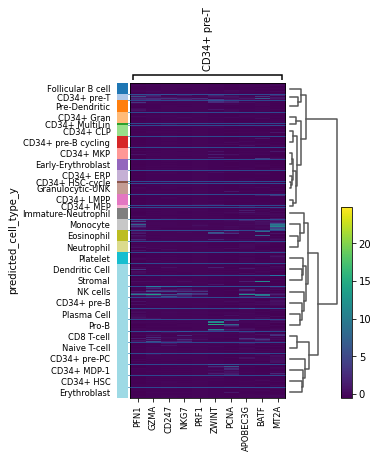

In [155]:
sc.pl.rank_genes_groups_heatmap(feature_adata, groups=['CD34+ pre-T'])

... storing 'groups' as categorical


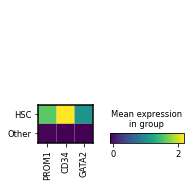

In [153]:
## stem
small = feature_adata.copy()
small.obs['groups'] = ['HSC' if 'CD34+ HSC' in x else 'Other'
                      for x in small.obs['predicted_cell_type_y']]
genes = ['PROM1', 'CD34', 'SALL4', 'NR0B1', 'ESRRB', 'TBX3', 'TCL1A', 'RIF1', 'NACC1','ZNF281']
genes = ['PROM1', 'CD34', 'GATA2']
sc.pl.matrixplot(small, var_names=genes, groupby='groups',)


... storing 'groups' as categorical


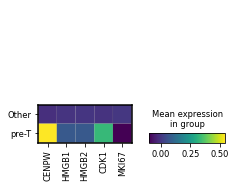

In [154]:
## pre-T
small = feature_adata.copy()
small.obs['groups'] = ['pre-T' if 'pre-T' in x else 'Other'
                      for x in small.obs['predicted_cell_type_y']]
genes = ['CENPW', 'HMGB1', 'HMGB2', 'CDK1', 'MKI67']
sc.pl.matrixplot(small, var_names=genes, groupby='groups',)


... storing 'groups' as categorical


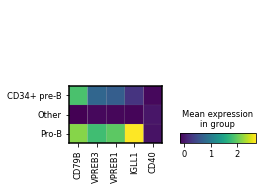

In [164]:
## pre-B
small = feature_adata.copy()
small.obs['groups'] = [x if x in ['CD34+ pre-B', 'Pro-B'] else 'Other'
                      for x in small.obs['predicted_cell_type_y']]
genes = ['CD79B', 'VPREB3', 'VPREB1', 'IGLL1']
sc.pl.matrixplot(small, var_names=genes, groupby='groups',)


In [ ]:
## pre-B
small = feature_adata.copy()
small.obs['groups'] = ['pre-B' if 'pre-B' in x else 'Other'
                      for x in small.obs['predicted_cell_type_y']]
genes = ['CD79B', 'VPREB3', 'VPREB1']
sc.pl.matrixplot(small, var_names=genes, groupby='groups',)


In [ ]:
genes = ['CENPW', 'HMGB1', 'HMGB2', 'CDK1', 'MKI67']
sc.pl.dotplot(small, var_names=genes, groupby='groups',)

In [ ]:
'DAX1', 'ESSRB1', 'TBX3', 'TCL1', 'RIF1', 'NAC1','ZFP281'

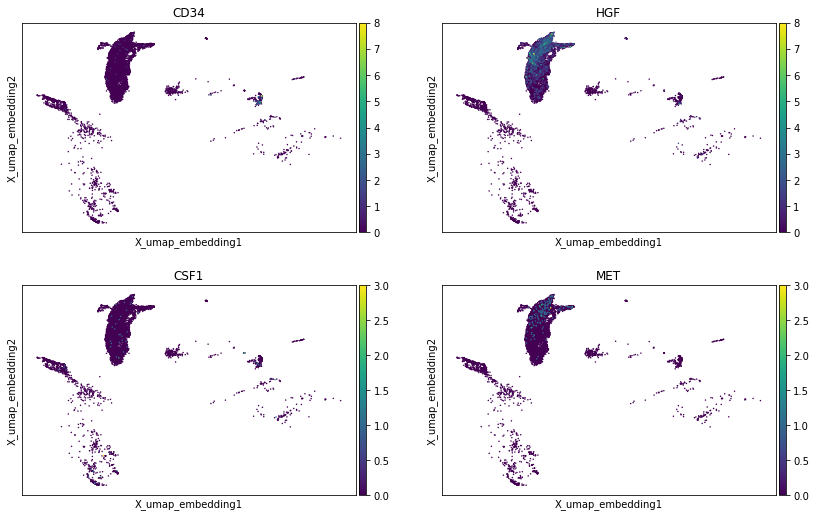

In [183]:

# filtered = mmy[[True if c in ['Plasma', 'Plasma_BM'] else False for c in mmy.obs['cell_type']]]
filtered = mmy[[True if (c in ['Plasma Cell', 'pro-B'] or 'CD34+' in c) else False
                for c in mmy.obs['predicted_cell_type_y']]]
sc.pl.embedding(filtered, basis='X_umap_embedding', color=['CD34', 'HGF', 'CSF1', 'MET'],
               ncols=2)

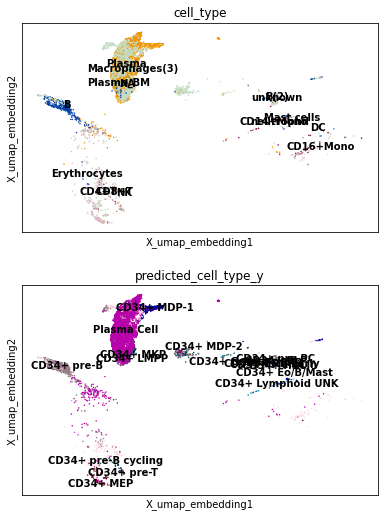

In [76]:
sc.pl.embedding(filtered, basis='X_umap_embedding', color=['cell_type', 'predicted_cell_type_y'],
               ncols=1, legend_loc='on data')

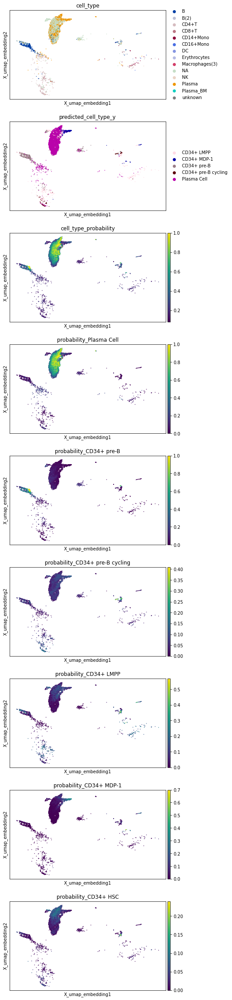

In [85]:

# filtered = mmy[[True if c in ['Plasma', 'Plasma_BM'] else False for c in mmy.obs['cell_type']]]
filtered = mmy[[True if c in ['Plasma Cell', 'CD34+ pre-B', 'CD34+ pre-B cycling', 'CD34+ LMPP',
                             'CD34+ MDP-1'] else False
                for c in mmy.obs['predicted_cell_type_y']]]
sc.pl.embedding(filtered, basis='X_umap_embedding', color=['cell_type', 'predicted_cell_type_y',
                                                        'cell_type_probability',
                                                          'probability_Plasma Cell',
                                                          'probability_CD34+ pre-B',
                                                          'probability_CD34+ pre-B cycling',
                                                          'probability_CD34+ LMPP',
                                                          'probability_CD34+ MDP-1',
                                                          'probability_CD34+ HSC'],
               ncols=1)

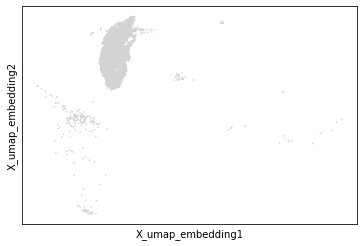

(10942, 24020)

In [87]:
explain_filtered = filtered[filtered.obs['predicted_cell_type_y']=='Plasma Cell']
sc.pl.embedding(explain_filtered, basis='X_umap_embedding')
explain_filtered.shape

In [105]:
explain, rest = balancedish_training_generator(explain_filtered, cell_type_key='predicted_cell_type_y',
                                               n_per_cell_type=500, oversample=False,
                                        split=1.)
background, _ = balancedish_training_generator(rest, cell_type_key='predicted_cell_type_y', n_per_cell_type=100,
                                               oversample=False,
                                           split=1.)
explain.shape, background.shape

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


((500, 24020), (100, 24020))

In [106]:
explain.obs['explain_key'] = 'CD34+ HSC'

Trying to set attribute `.obs` of view, copying.


In [107]:
w = explain_predictions(explain.copy(), background.copy(), module_fp, prediction_key='explain_key')
w

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'explain_key' as categorical
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-11-24 17:01:06,367 38645 genes in training set are missing from prediction set
2020-11-24 17:01:07,489 starting batch 1 of 1
is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
2020-11-24 17:01:07,660 38645 genes in training set are missing from prediction set
2020-11-24 17:01:10,582 38645 genes in training set are missing from prediction set
2020-11-24 17:01:13,599 (500, 58347)


,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,BX005132.2,AL645728.2,PDE11A-1,AL163152.1,AL139254.3,AL591163.1,AL589702.1,AC068587.10,AL034417.4,AL513220.1
index,,,,,,,,,,,,,,,,,,,,,
25183_AAATGCCGTGACAAAT-1,1.242259e-05,0.0,5.347551e-06,3.412128e-06,2.591117e-06,0.0,8.638269e-07,2.443030e-06,1.363249e-06,1.277500e-05,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_AACGTTGCAGGGTACA-1,1.202954e-07,0.0,2.392176e-06,2.578061e-07,8.573780e-07,0.0,2.528805e-07,5.667602e-05,9.202661e-05,7.939639e-07,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_AAGGTTCCATCAGTCA-1,0.000000e+00,0.0,8.037660e-07,1.274900e-06,4.900128e-06,0.0,4.059227e-07,1.445149e-06,3.032558e-06,5.787632e-06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_ACAGCCGGTAGTACCT-1,4.732519e-06,0.0,1.596369e-05,9.650500e-06,3.167359e-07,0.0,9.815926e-07,7.672038e-06,4.645087e-06,3.291200e-06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25183_ACATACGGTGGTACAG-1,2.522242e-06,0.0,1.288416e-05,5.196199e-06,3.157025e-06,0.0,1.077121e-06,1.978441e-04,4.326971e-06,1.845429e-05,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MMY21940_TTCATGTGTCCTACGG-1,7.510700e-06,0.0,5.300521e-06,5.737671e-06,2.310476e-06,0.0,2.829711e-07,1.016940e-05,1.347891e-06,1.778806e-07,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MMY21940_TTGGTTTTCAGCTTCC-1,5.391028e-06,0.0,1.541994e-06,1.607883e-06,2.344776e-07,0.0,0.000000e+00,2.065103e-05,3.270466e-06,3.436611e-04,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MMY21940_TTTACGTGTCTAACGT-1,9.388406e-06,0.0,6.215043e-06,1.241878e-06,2.721660e-06,0.0,7.233670e-07,2.718214e-07,2.820588e-07,1.008030e-07,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [108]:
tumor_weights = anndata.AnnData(X=w.values, obs=explain.obs.copy())
tumor_weights.var.index = w.columns
tumor_weights

AnnData object with n_obs × n_vars = 500 × 58347
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'sample', 'predicted_cell_type_x', 'probability', 'new.ident', 'ident', 'predicted_cell_type_y', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probability_Eosinophil', 'probability_Erythroblast', 'probability_Follicular B cell

In [158]:
feature_adata = tumor_weights.copy()

sc.pp.scale(feature_adata)
sc.pp.neighbors(feature_adata, n_neighbors=5, n_pcs=40)
sc.pp.pca(feature_adata)

sc.tl.umap(feature_adata, min_dist=.5)
sc.tl.leiden(feature_adata, resolution=.3)
feature_adata

         Falling back to preprocessing with `sc.pp.pca` and default params.


AnnData object with n_obs × n_vars = 500 × 58347
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'sample', 'predicted_cell_type_x', 'probability', 'new.ident', 'ident', 'predicted_cell_type_y', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probability_Eosinophil', 'probability_Erythroblast', 'probability_Follicular B cell

In [196]:
pc_feature_adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,sample,...,probability_NK cells,probability_Naive T-cell,probability_Neutrophil,probability_Plasma Cell,probability_Platelet,probability_Pre-Dendritic,probability_Pro-B,probability_Stromal,explain_key,leiden
index,,,,,,,,,,,,,,,,,,,,,
25183_AAATGCCGTGACAAAT-1,25183,1799.0,381,0.014452,3428.0,400,2,2,Plasma,NA,...,0.12,0.00,0.12,0.14,0.03,0.00,0.00,0.05,CD34+ HSC,4
25183_AACGTTGCAGGGTACA-1,25183,2583.0,766,0.016260,3256.0,763,0,0,Plasma,NA,...,0.06,0.03,0.04,0.31,0.02,0.00,0.02,0.03,CD34+ HSC,5
25183_AAGGTTCCATCAGTCA-1,25183,5195.0,869,0.003657,3650.0,861,1,1,Plasma,NA,...,0.02,0.03,0.04,0.61,0.00,0.00,0.00,0.02,CD34+ HSC,5
25183_ACAGCCGGTAGTACCT-1,25183,7342.0,1331,0.005857,3795.0,1171,0,0,Plasma,NA,...,0.02,0.01,0.03,0.64,0.01,0.00,0.01,0.05,CD34+ HSC,0
25183_ACATACGGTGGTACAG-1,25183,9664.0,1852,0.016349,3918.0,1371,0,0,Plasma,NA,...,0.02,0.00,0.00,0.82,0.00,0.00,0.00,0.06,CD34+ HSC,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MMY21940_TTCATGTGTCCTACGG-1,MMY21940,4580.0,1002,0.093886,3500.0,999,2,2,NA,NA,...,0.03,0.03,0.00,0.66,0.00,0.00,0.00,0.08,CD34+ HSC,0
MMY21940_TTGGTTTTCAGCTTCC-1,MMY21940,5006.0,1588,0.150619,3811.0,1568,2,2,NA,NA,...,0.00,0.00,0.00,0.32,0.00,0.02,0.02,0.21,CD34+ HSC,0
MMY21940_TTTACGTGTCTAACGT-1,MMY21940,2909.0,717,0.007219,3217.0,716,2,2,NA,NA,...,0.01,0.13,0.03,0.23,0.00,0.00,0.00,0.00,CD34+ HSC,5


is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'explain_key' as categorical


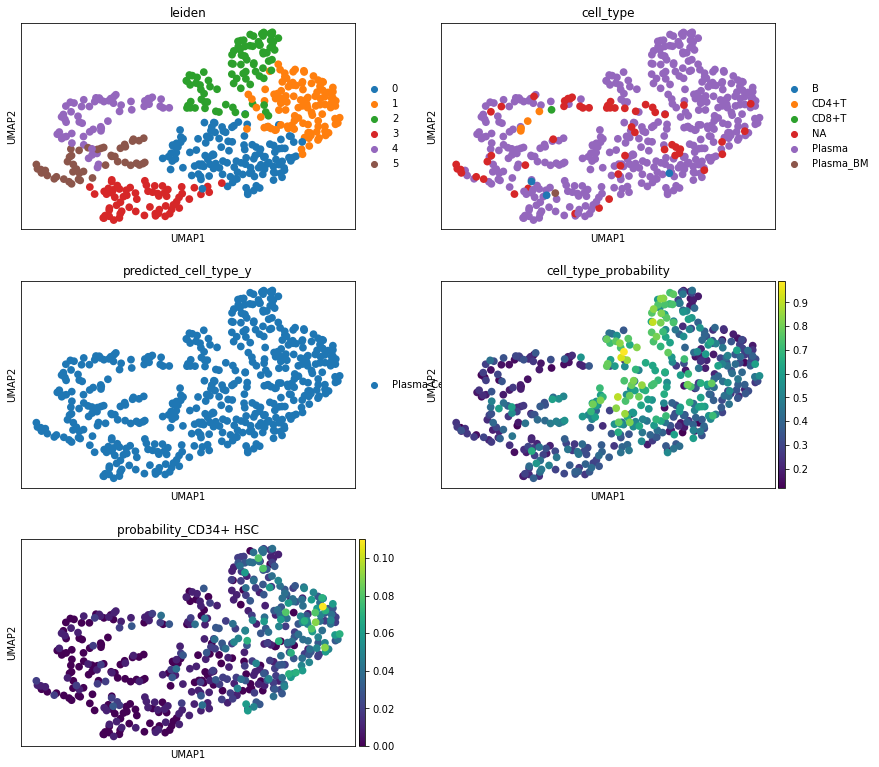

In [159]:
sc.pl.umap(feature_adata, color=['leiden', 'cell_type', 'predicted_cell_type_y',
                'cell_type_probability', 'probability_CD34+ HSC'],
          ncols=2)

In [160]:
protein_coding_mask = [True if g in adata.raw.var.index and adata.raw.var.loc[g, 'featuretype']=='protein_coding' else False
                      for g in feature_adata.var.index]
pc_feature_adata = feature_adata[:, protein_coding_mask]

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


Trying to set attribute `.uns` of view, copying.


invalid value encountered in log2


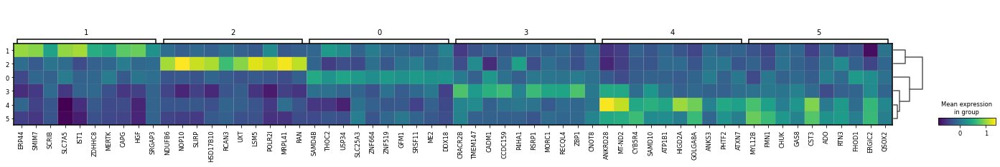

In [161]:
sc.tl.rank_genes_groups(pc_feature_adata, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups_matrixplot(pc_feature_adata)

categories: 0, 1, 2, etc.
var_group_labels: 1


is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


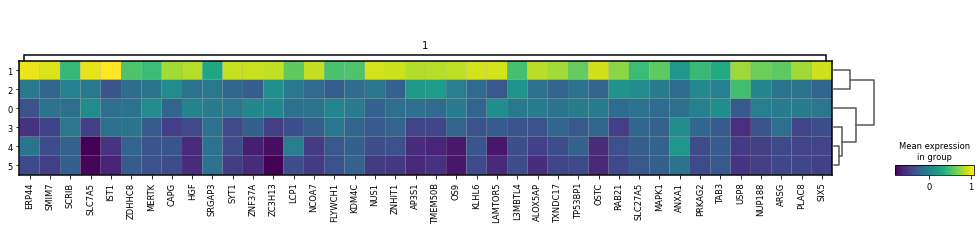

In [177]:
sc.pl.rank_genes_groups_matrixplot(pc_feature_adata, groups=['1'], n_genes=40)

In [191]:
for x in list(pc_feature_adata.uns['rank_genes_groups']['names']['1'])[:100]: print(x)

ERP44
SMIM7
SCRIB
SLC7A5
IST1
ZDHHC8
MERTK
CAPG
HGF
SRGAP3
SYT1
ZNF37A
ZC3H13
LCP1
NCOA7
FLYWCH1
KDM4C
NUS1
ZNHIT1
AP3S1
TMEM50B
OS9
KLHL6
LAMTOR5
L3MBTL4
ALOX5AP
TXNDC17
TP53BP1
OSTC
RAB21
SLC27A5
MAPK1
ANXA1
PRKAG2
TAB3
USP8
NUP188
ARSG
PLAC8
SIX5
KIAA0368
LAPTM4A
FAM96B
ACAP2
RASSF2
METTL9
NADK
NR3C1
HSPG2
JRK
FAM91A1
ATP6V0B
SFT2D2
TMEM57
ATXN2
GSE1
SERTAD2
C19orf47
RERE
SLC2A13
ARF4
UFL1
MAF
JMJD6
MAGT1
CFAP54
ZNRF2
IL6ST
SASH3
PRKACA
ZMIZ2
FAM199X
SCPEP1
HIST1H2BK
SLC6A6
POLDIP3
PKD1
MLLT3
PIK3AP1
UBE2Q2
ANKRD27
GPR82
MS4A4A
LMF2
TMEM54
LYZ
VCAN
ADAL
SETD3
GGCX
NUP214
BTAF1
RBP7
UBOX5
CDV3
TNS3
FANCI
SLC25A45
APPBP2
NRAS


is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


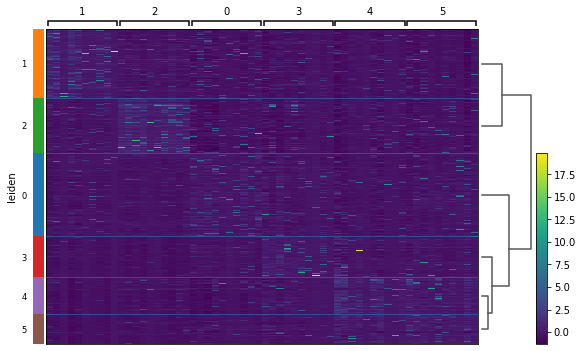

In [164]:
sc.pl.rank_genes_groups_heatmap(pc_feature_adata)

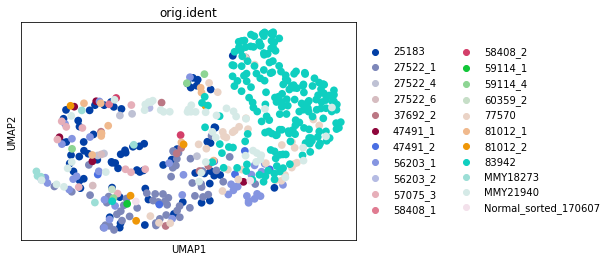

In [198]:
sc.pl.umap(pc_feature_adata, color=['orig.ident'],
          ncols=2)

In [199]:
set(pc_feature_adata[pc_feature_adata.obs['leiden']=='1'].obs['orig.ident'])

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


{'77570', '83942', 'MMY21940'}

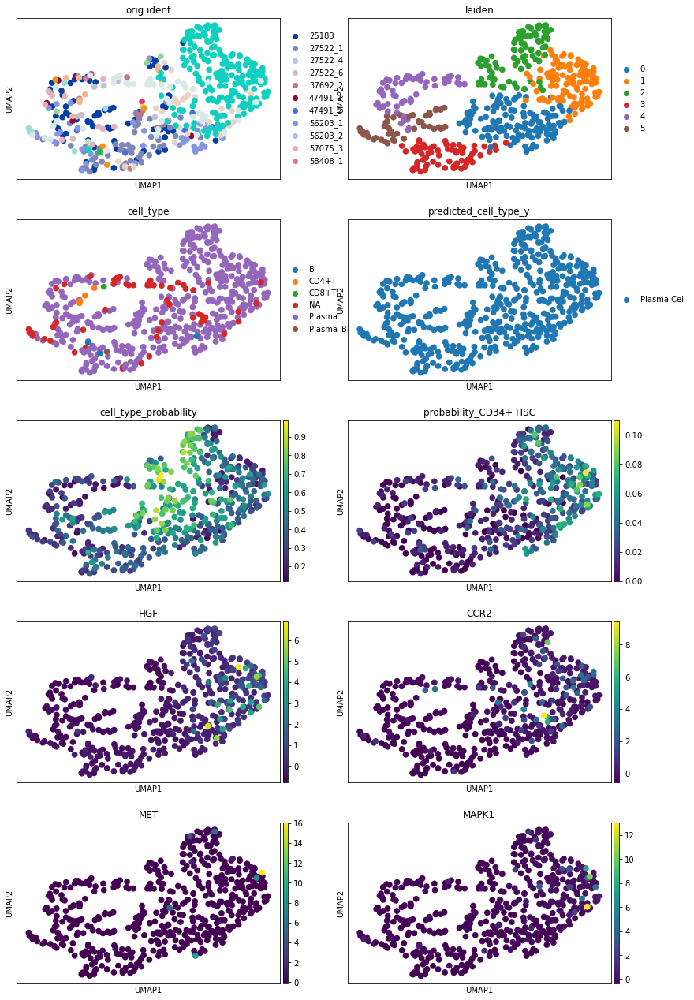

In [204]:
sc.pl.umap(pc_feature_adata, color=['orig.ident', 'leiden', 'cell_type', 'predicted_cell_type_y',
                'cell_type_probability', 'probability_CD34+ HSC', 'HGF',
                                'CCR2', 'MET', 'MAPK1'],
          ncols=2)

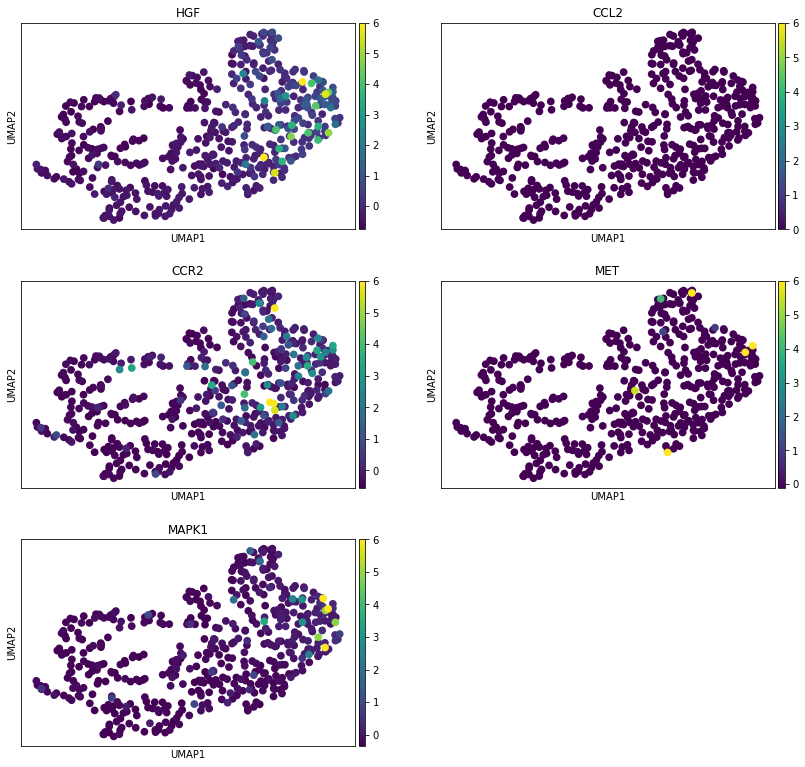

In [207]:
sc.pl.umap(pc_feature_adata, color=['HGF',
                                'CCR2', 'MET', 'MAPK1'],
          ncols=2, vmax=6)

https://www.nature.com/articles/s41388-020-01393-x

In [173]:
m1 = explain.copy()
# sc.pp.highly_variable_genes(m1, n_top_genes=3000)
sc.pp.log1p(m1)
sc.pp.scale(m1)
sc.pp.neighbors(m1)
sc.pp.pca(m1)

sc.tl.umap(m1)
sc.tl.leiden(m1, resolution=.05)
m1

         Falling back to preprocessing with `sc.pp.pca` and default params.


AnnData object with n_obs × n_vars = 500 × 24020
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_type', 'sample', 'predicted_cell_type_x', 'probability', 'new.ident', 'ident', 'predicted_cell_type_y', 'cell_type_probability', 'probability_CD34+ CLP', 'probability_CD34+ ERP', 'probability_CD34+ ERP-Early', 'probability_CD34+ Eo/B/Mast', 'probability_CD34+ Gran', 'probability_CD34+ HSC', 'probability_CD34+ HSC-cycle', 'probability_CD34+ LMPP', 'probability_CD34+ Lymphoid UNK', 'probability_CD34+ MDP-1', 'probability_CD34+ MDP-2', 'probability_CD34+ MEP', 'probability_CD34+ MKP', 'probability_CD34+ MultiLin', 'probability_CD34+ pre-B', 'probability_CD34+ pre-B cycling', 'probability_CD34+ pre-PC', 'probability_CD34+ pre-T', 'probability_CD8 T-cell', 'probability_Dendritic Cell', 'probability_Early-Erythroblast', 'probability_Eosinophil', 'probability_Erythroblast', 'probability_Follicular B cell

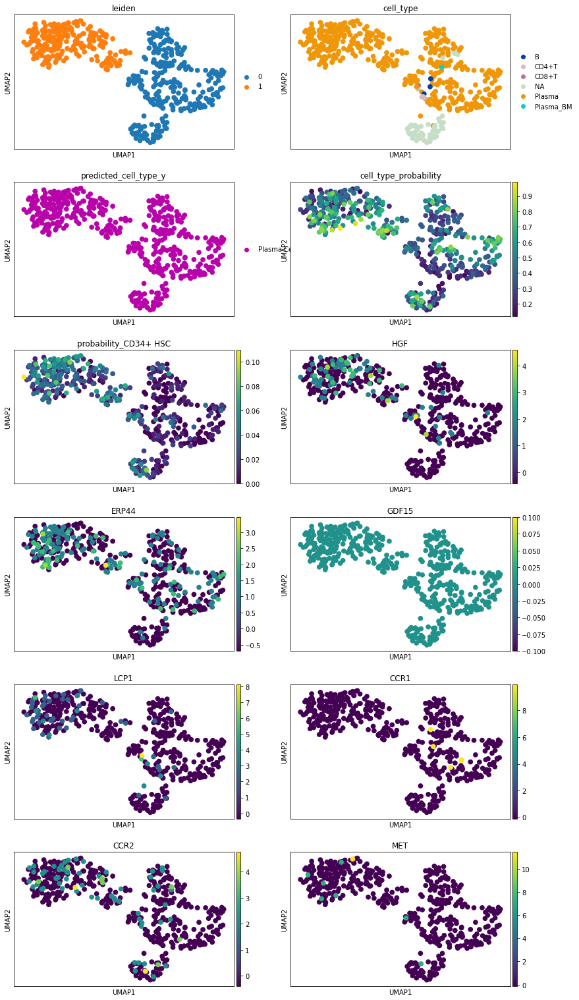

In [188]:
sc.pl.umap(m1, color=['leiden', 'cell_type', 'predicted_cell_type_y',
                'cell_type_probability', 'probability_CD34+ HSC', 'HGF', 'ERP44',
                                'GDF15', 'LCP1', 'CCR1', 'CCR2', 'MET'],
          ncols=2)

In [175]:
m1.obsm['feature_umap'] = pc_feature_adata.obsm['X_umap'].copy()

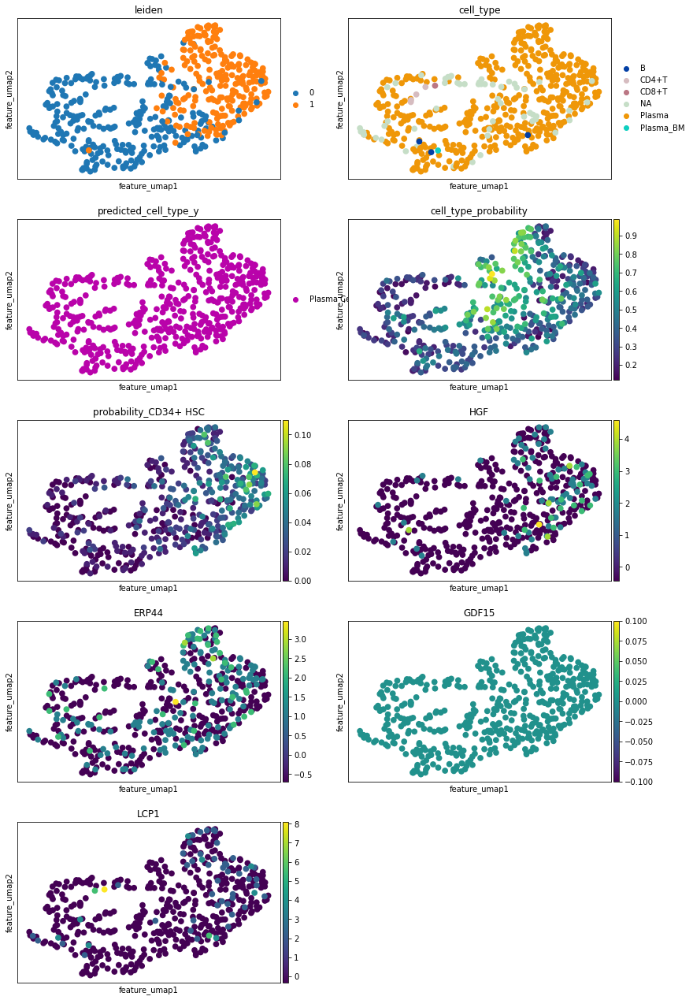

In [176]:
sc.pl.embedding(m1, basis='feature_umap', color=['leiden', 'cell_type', 'predicted_cell_type_y',
                'cell_type_probability', 'probability_CD34+ HSC', 'HGF', 'ERP44',
                                'GDF15', 'LCP1'],
          ncols=2)

In [126]:
Counter(adata.var['featuretype']).most_common()

[('protein_coding', 1638),
 ('lincRNA', 342),
 ('antisense_RNA', 239),
 ('processed_pseudogene', 233),
 ('IG_V_gene', 91),
 ('misc_RNA', 67),
 ('snRNA', 61),
 ('unprocessed_pseudogene', 51),
 ('transcribed_unprocessed_pseudogene', 35),
 ('miRNA', 34),
 ('processed_transcript', 31),
 ('TR_V_gene', 25),
 ('snoRNA', 24),
 ('TEC', 24),
 ('sense_intronic', 22),
 ('IG_V_pseudogene', 14),
 ('IG_C_gene', 13),
 ('transcribed_processed_pseudogene', 7),
 ('TR_J_gene', 7),
 ('transcribed_unitary_pseudogene', 6),
 ('TR_C_gene', 6),
 ('rRNA', 5),
 ('sense_overlapping', 5),
 ('IG_J_gene', 4),
 ('IG_C_pseudogene', 4),
 ('TR_V_pseudogene', 3),
 ('scaRNA', 3),
 ('polymorphic_pseudogene', 2),
 ('unitary_pseudogene', 2),
 ('IG_D_gene', 1),
 ('scRNA', 1)]